<h1>Introduction</h1>
In this project we studied people's consumption habits in order to predict their future orders.<br>
For this purpose, we based ourselves on Shufersal ML data showing about 3,300,000 orders made by different users.<br>
Throughout the project we explored the data to identify trends and phenomena occurring in it and used them to create features that would describe the habits, trends and the customers themselves. We will also show the relationship between them.<br>
After that, we classified the customers and the products according to two machine learning models.<br>
We used three different machine learning models to predict which products will be present on the future orders.

<h1>Table of Contents:</h1>
<ol>
    <li>Importing libreries</li>
    <li>Uploading Data</li>
    <li>Data Exploration and Visualization</li>
    <li>Data Pre-Processing</li>
    <li>Chi-Square test - Bonus</li>
    <li>Customer classification</li>
        <ol>
    <li>KMeans</li>
    <li>Mean Shift</li>
    <li>Clustering and Dimensions Reduction - Bonus</li>
        <ol>
    <li>KMeans on the PCA</li>
        <li>Mean Shift on the PCA</li>
            </ol>
        </ol>
    <li>Product Classification</li>
    <li>Prediction</li>
        <ol>
    <li>Random Forest</li>
    <li>Gradient Boosting</li>  
    <li>KNN</li>
    </ol>   
</ol>


<p id=0><h1>Importing Libraries</h1></p>

In [1]:
import warnings
warnings.filterwarnings('ignore')


# 2 - data and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# 3 - pre-processing
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

# 4 - prediction

# model building
from sklearn.model_selection import train_test_split, GridSearchCV

# model evaluation
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

#clustering:
#kmeans
from sklearn.cluster import KMeans
#mean shift
from sklearn.cluster import MeanShift, estimate_bandwidth

#prediction 
# random forest
from sklearn.ensemble import RandomForestClassifier
# gradient boosting
from sklearn.ensemble import GradientBoostingClassifier
# KNN
from sklearn.neighbors import KNeighborsClassifier

#Dimensions Reduction - PCA
from sklearn.decomposition import PCA

#Chi-Square
from scipy.stats import chi2_contingency

#time
import time

RSEED = 10

<h1 id="Upload_Data">Upload Data</h1>

In [2]:
aisles = pd.read_csv('aisles.csv')
departments=pd.read_csv('departments.csv')
products=pd.read_csv('products.csv')

In [3]:
orders=pd.read_csv('orders.csv')
order_products_prior=pd.read_csv('order_products__prior.csv')
order_products_train_test=pd.read_csv('order_products__train_test.csv')
target=pd.read_csv('target.csv')

<p id="1">
<h1>Data Exploration and Visualization</h1>
In this section, I will be exploring and visualizing the data and its variables to get a better understanding of what is required in the pre-processing section.
First of all we will investigate each dataset separately and then we will make comparisons between them.<br>
<strong>We will also start part of the preprocessing by changing the type of variables that need to be changed and check and removing nulls</strong></p>

<h2>aisles</h2>
This dataset contains a list of aisles that can have products.
<h6>Variables:</h6>
<ol>
    <li>aisle_id : aisle ID of item</li>
    <li>aisle_name : name of aisle</li>
</ol>
Due to the fact that the dataset contains only a aisle number and its name, there is nothing to show visualizations on it

In [4]:
# look at 5 random observations 
display(aisles.sample(5))

,aisle_id,aisle
51,52,frozen breakfast
42,43,buns rolls
85,86,eggs
63,64,energy sports drinks
80,81,canned jarred vegetables


In [5]:
# data shape (rows, columns)
print(aisles.shape)

(134, 2)


In [6]:
# variables data types
print(aisles.dtypes)

aisle_id     int64
aisle       object
dtype: object


In [7]:
# change aisle_id data type to category and aisle to string 
aisles['aisle_id']=aisles['aisle_id'].astype('int16')
aisles['aisle']=aisles['aisle'].astype('string')

In [8]:
#checking null values
display(aisles.isnull().sum())

aisle_id    0
aisle       0
dtype: int64

<h2>departments</h2>
This dataset contains a list of departments into which the products are divided
<h6>Variables:</h6>
<ol>
    <li>department_id : product ID of item</li>
    <li>department_name : name of department</li>
</ol>
Due to the fact that the dataset contains only a departments number and its name, there is nothing to show visualizations on it

In [9]:
# look at 5 random observations 
display(departments)

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol
5,6,international
6,7,beverages
7,8,pets
8,9,dry goods pasta
9,10,bulk


In [10]:
# data shape (rows, columns)
print(departments.shape)

(21, 2)


In [11]:
# variables data types
print(departments.dtypes)

department_id     int64
department       object
dtype: object


In [12]:
# change department_id data type to category and department to string
departments['department_id']=departments['department_id'].astype('int8')
departments['department']=departments['department'].astype('string')

In [13]:
display(departments.isnull().sum())

department_id    0
department       0
dtype: int64

<h2>products</h2>
This dataset contains a list of products that are sold in the store.
<h6>Variables:</h6>
<ol>
    <li>product_id : product ID of item</li>
    <li>product_name : name of product</li>
    <li>aisle_id : aisle id of the product</li>
    <li>department_id : department id of the product</li>
</ol>

In [14]:
# look at 5 random observations 
display(products.sample(5))

,product_id,product_name,aisle_id,department_id
24109,24110,Blasted Chocolatey Chip Marshmallow Rice Krisp...,45,19
29010,29011,Rubbed Sage,104,13
47900,47901,Frosted Devil's Food Donuts,93,3
5140,5141,Organic Iced Black Tea,94,7
11358,11359,Sensational Strawberry Cheese Danish,61,19


In [15]:
# data shape (rows, columns)
print(products.shape)

(49688, 4)


In [16]:
# variables data types
print(products.dtypes)

product_id        int64
product_name     object
aisle_id          int64
department_id     int64
dtype: object


In [17]:
# change product_id,aisle_id and department_id data type to string and product_name to string
products['product_id']=products['product_id'].astype('int32')
products['aisle_id']=products['aisle_id'].astype('int16')
products['department_id']=products['department_id'].astype('int8')
products['product_name']=products['product_name'].astype('string')

In [18]:
display(products.isnull().sum())

product_id       0
product_name     0
aisle_id         0
department_id    0
dtype: int64

In [19]:
# group dataset by aisle and count the number of observations in each aisle
grouped = products.groupby('aisle_id').count()
freq = grouped['product_id'].values

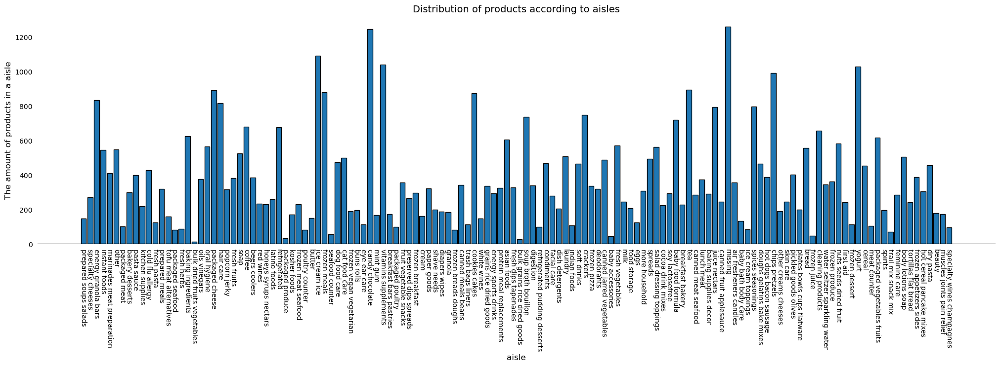

In [20]:
plt.figure(figsize=(25, 6))
plt.bar(aisles['aisle_id'], freq, edgecolor='black')
plt.xticks(aisles['aisle_id'],aisles['aisle'],rotation =270)
plt.title('Distribution of products according to aisles', fontsize=14)
plt.xlabel('aisle', fontsize=12)
plt.ylabel('The amount of products in a aisle', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

It can be seen that there are aisles with many products and that there are with less, and that the products are not distributed quite evenly between the aisles

In [21]:
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}% \\ {:d}".format(pct, absolute)

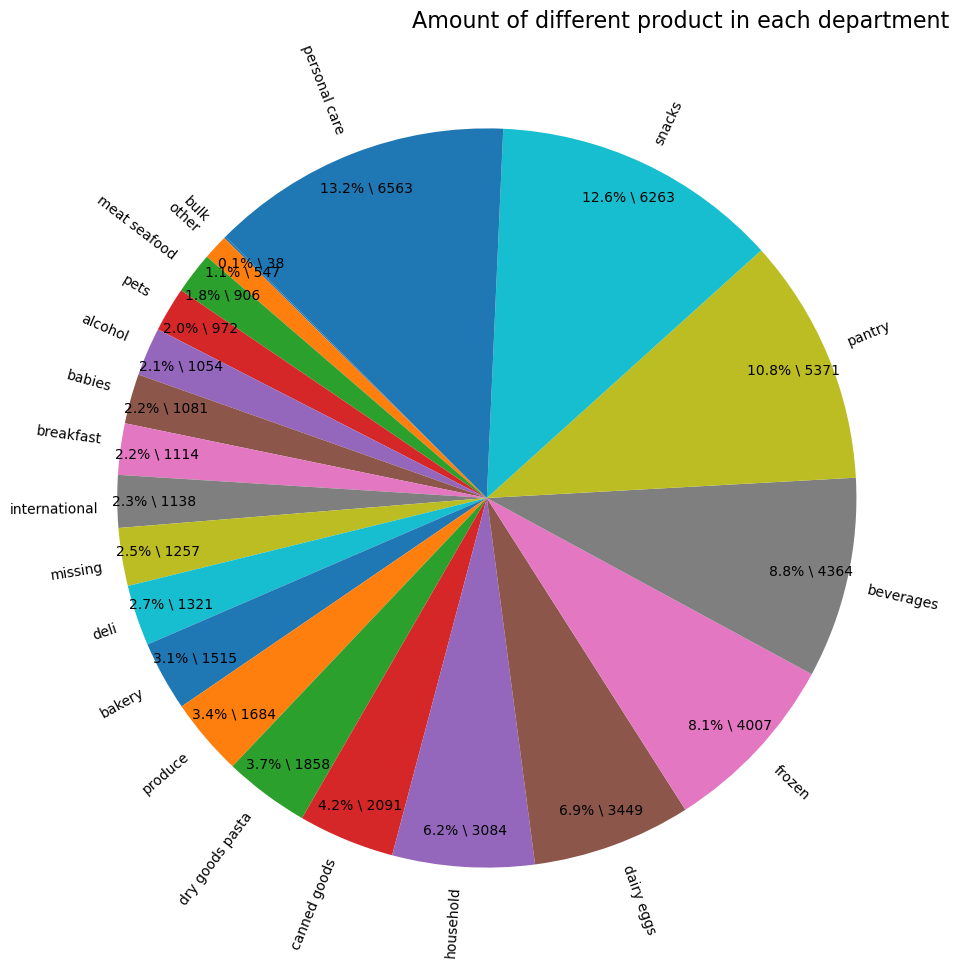

In [22]:
pieChartProducts = products.groupby('department_id').count().sort_values(by = 'product_name')
pieChartProducts = pd.merge(pieChartProducts, departments, left_index=True, right_on='department_id')
pieChartProducts.rename(columns = {'product_id':'vareity'}, inplace = True)
data = pieChartProducts['product_name']
label = pieChartProducts['department']
plt.figure(figsize = (12, 12))
plt.pie(data, labels = label, autopct = lambda pct: func(pct, data), textprops={'fontsize':10}, pctdistance=0.9, rotatelabels=True, labeldistance=1.05, startangle=135)
plt.title(label = 'Amount of different product in each department', fontdict={'fontsize':16}, loc='right')
plt.show()

It can be seen that there are departments with many products and that there are with less, and that the products are not distributed quite evenly between the departments

<h2>orders</h2>
This dataset indicates to which set (prior, train, test) an order belongs, and extra details about the orders
<h6>Variables:</h6>
<ol>
    <li> Order_id : Unique for every order</li>
    <li> User_id : Unique for every user</li>
    <li>Eval_set : ( prior / train / test)</li>
    <li>Order_number : the number order placed by user</li>
    <li>Order_dow : Day of week</li>
    <li>Order_hour_of_day : Time of day in hr</li>
    <li>Days_since_prior_order : difference in days between 2 orders</li>
</ol>

In [23]:
# look at 5 random observations 
display(orders.sample(5))

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
2980243,1986639,191221,prior,13,4,9,15.0
2902134,2215043,186256,prior,29,1,15,7.0
2997547,878778,192328,prior,4,4,18,10.0
437217,312412,28008,prior,3,6,15,8.0
913773,1851700,58417,prior,22,6,8,7.0


In [24]:
# data shape (rows, columns)
print(orders.shape)

(3346083, 7)


In [25]:
# variables data types
print(orders.dtypes)

order_id                    int64
user_id                     int64
eval_set                   object
order_number                int64
order_dow                   int64
order_hour_of_day           int64
days_since_prior_order    float64
dtype: object


In [26]:
# change order_id, user_id and order_number data type to int and eval_set to string
orders['order_id']=orders['order_id'].astype('int32')
orders['user_id']=orders['user_id'].astype('int32')
orders['order_number']=orders['order_number'].astype('int8')
orders['order_dow']=orders['order_dow'].astype('int8')
orders['order_hour_of_day']=orders['order_hour_of_day'].astype('int8')
orders['days_since_prior_order']=orders['days_since_prior_order'].astype('float32')
orders['eval_set'] = orders['eval_set'].astype('string')

In [27]:
display(orders.isnull().sum())

order_id                       0
user_id                        0
eval_set                       0
order_number                   0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    206209
dtype: int64

We noticed that not all orders have a "day since the previous order", this is due to the fact that this is their first order
This will be handled during the feature engineering phase, since we need to place different values instead of NaN

In [28]:
# display descriptive statistics for numeric variables
display(orders.describe())

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
count,3.346083e+06,3.346083e+06,3.346083e+06,3.346083e+06,3.346083e+06,3.139874e+06
mean,1.710561e+06,1.029778e+05,1.716804e+01,2.776053e+00,1.344887e+01,1.097229e+01
std,9.875758e+05,5.953534e+04,1.775659e+01,2.044998e+00,4.226137e+00,9.136299e+00
min,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,8.552595e+05,5.139100e+04,5.000000e+00,1.000000e+00,1.000000e+01,4.000000e+00
50%,1.710552e+06,1.026750e+05,1.100000e+01,3.000000e+00,1.300000e+01,7.000000e+00
75%,2.565877e+06,1.543870e+05,2.300000e+01,5.000000e+00,1.600000e+01,1.500000e+01
max,3.421083e+06,2.062090e+05,1.000000e+02,6.000000e+00,2.300000e+01,3.000000e+01


In [29]:
# group dataset by eval_set and count the number of observations in each eval_set
grouped = orders.groupby('eval_set').count()
freq = grouped['order_id'].values

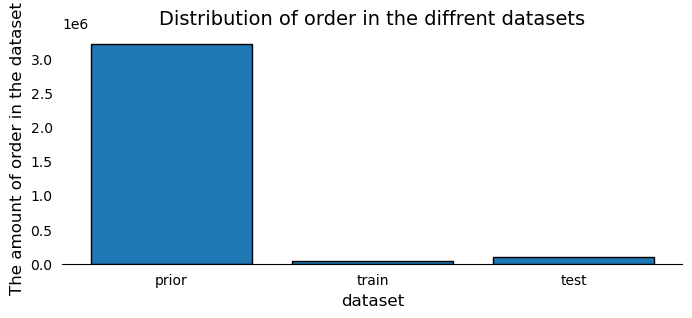

In [30]:
plt.figure(figsize=(8, 3))
plt.bar(['prior','train','test'], freq, edgecolor='black')
plt.xticks(['prior','train','test'])
plt.title('Distribution of order in the diffrent datasets', fontsize=14)
plt.xlabel('dataset', fontsize=12)
plt.ylabel('The amount of order in the dataset', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

It can be seen that most of the orders belong to the prior

In [31]:
# group dataset by user and count the number of observations in each user
grouped = orders.groupby('user_id').count()

In [32]:
#checking how many different users there are and present statics
print('users number:',len(grouped))
display(grouped.describe())

users number: 206209


,order_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
count,206209.000000,206209.000000,206209.000000,206209.000000,206209.000000,206209.000000
mean,16.226658,16.226658,16.226658,16.226658,16.226658,15.226658
std,16.662238,16.662238,16.662238,16.662238,16.662238,16.662238
min,3.000000,3.000000,3.000000,3.000000,3.000000,2.000000
25%,6.000000,6.000000,6.000000,6.000000,6.000000,5.000000
50%,10.000000,10.000000,10.000000,10.000000,10.000000,9.000000
75%,20.000000,20.000000,20.000000,20.000000,20.000000,19.000000
max,100.000000,100.000000,100.000000,100.000000,100.000000,99.000000


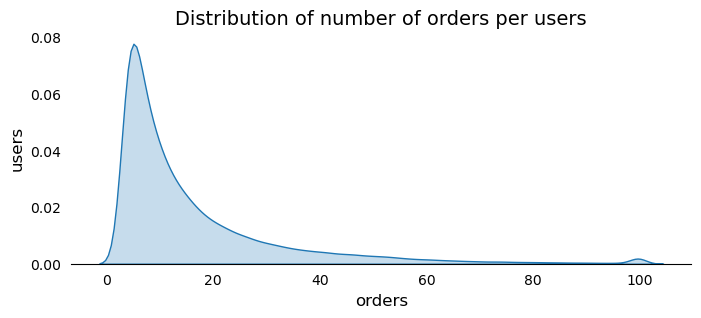

In [33]:
plt.figure(figsize=(8, 3))
sns.kdeplot(data=grouped['order_id'], fill=True, palette='Blues', common_norm=True)
plt.title('Distribution of number of orders per users', fontsize=14)
plt.xlabel('orders', fontsize=12)
plt.ylabel('users', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

It can be seen that most customers made between a single and 20 orders and a small minority reached 100

In [34]:
# group dataset by day of week and count the number of observations in each day of week
grouped = orders.groupby('order_dow').count()
freq = grouped['order_id'].values

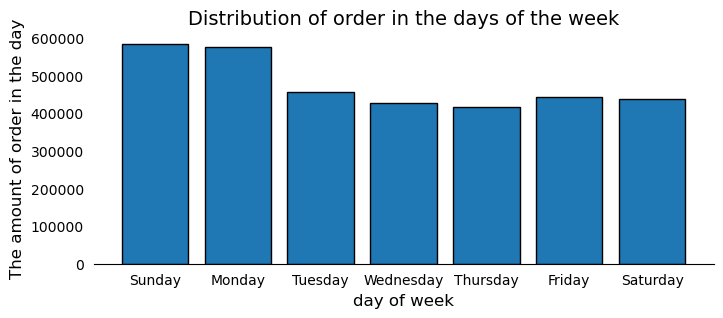

In [35]:
days=['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
plt.figure(figsize=(8, 3))
plt.bar([0,1,2,3,4,5,6], freq, edgecolor='black')
plt.xticks([0,1,2,3,4,5,6],days)
plt.title('Distribution of order in the days of the week', fontsize=14)
plt.xlabel('day of week', fontsize=12)
plt.ylabel('The amount of order in the day', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

You can see that on Sundays and Mondays more are ordered than the rest of the week

In [36]:
# group dataset by order_hour_of_day and count the number of observations in each order_hour_of_day
grouped = orders.groupby('order_hour_of_day').count()
freq = grouped['order_id'].values

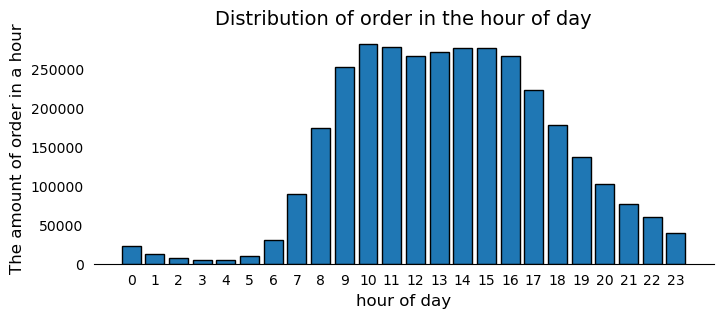

In [37]:
plt.figure(figsize=(8, 3))
plt.bar(list(range(0,24)), freq, edgecolor='black')
plt.xticks(list(range(0,24)))
plt.title('Distribution of order in the hour of day', fontsize=14)
plt.xlabel('hour of day', fontsize=12)
plt.ylabel('The amount of order in a hour', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

It can be seen that most orders are made between late morning and afternoon. Most of the other orders were in the evening and a small minority at night and early morning hours.

In addition to that, we would like to examine whether on different days, there are differences between the hours

In [38]:
# group dataset by day of week and order_hour_of_day
#and count the number of observations in each day of week and order_hour_of_day
grouped = orders[orders['eval_set']=='prior']
grouped = grouped.groupby(['order_dow','order_hour_of_day']).count().reset_index()

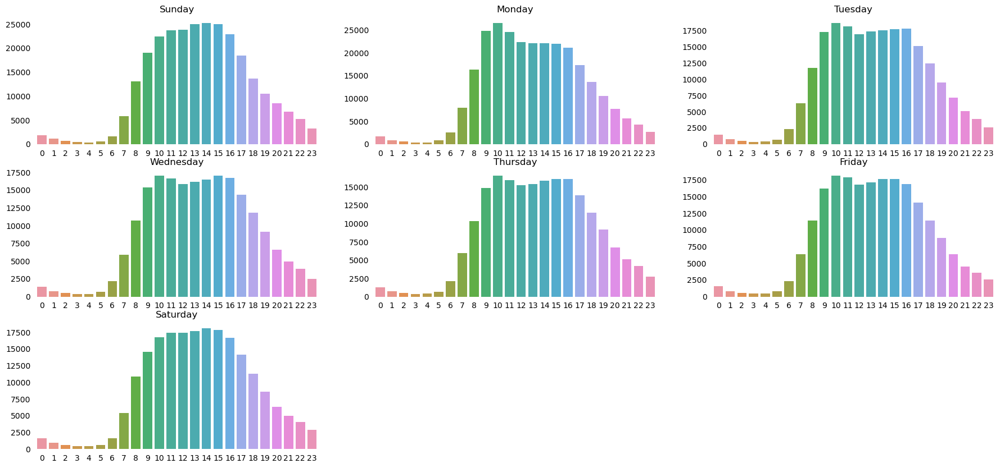

In [39]:
# plot barplots for each day

plt.figure(figsize=(22, 10))

for day in range(0,7):
    h1=day*24
    h2=day*24+23
    freq = grouped.loc[h1:h2,'order_id'].reset_index().transpose()
    plt.subplot(3, 3, day+1)
    sns.barplot(data=freq,ci=None)
    sns.despine(top=True, right=True, bottom=True, left=True)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
    plt.title(days[day])

we can see that the peak times are very similar, however Snday and Monday have more orders compared to the rest of the week

In [40]:
#We will check whether the distribution of the products over time is different from that of the orders
groupedByProducts = pd.merge(orders[orders['eval_set']=='prior'], order_products_prior, on='order_id')
groupedByProducts = groupedByProducts.groupby(['order_dow','order_hour_of_day']).count().reset_index()

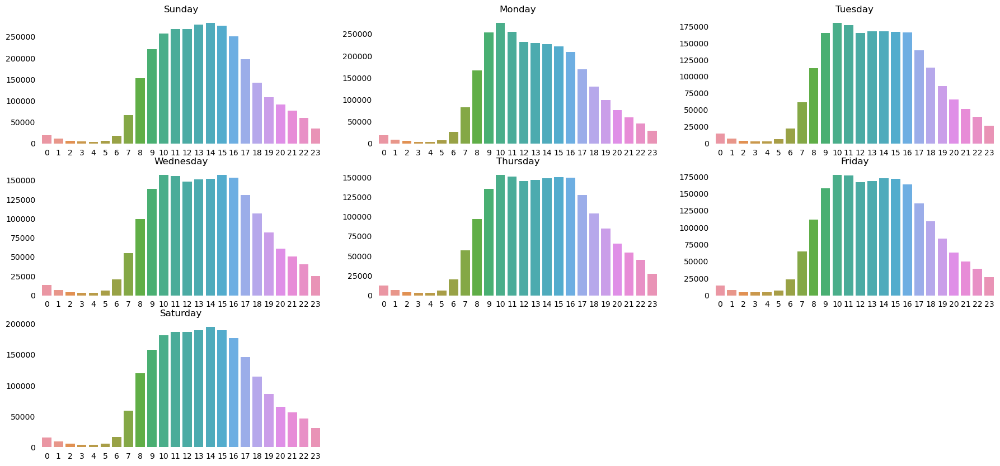

In [41]:
# plot barplots for each day

plt.figure(figsize=(22, 10))

for day in range(0,7):
    h1=day*24
    h2=day*24+23
    freq = groupedByProducts.loc[h1:h2,'order_id'].reset_index().transpose()
    plt.subplot(3, 3, day+1)
    sns.barplot(data=freq,ci=None)
    sns.despine(top=True, right=True, bottom=True, left=True)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
    plt.title(days[day])

The distribution of number of products is also the same as number of orders. So we can conclude that amount of orders and amount of products each hour and day behave similar

<h2>order_products</h2>
This datasets specify which products were purchased in each order.
<h6>Variables:</h6>
<ol>
    <li>order_id : Unique order id for every order</li>
    <li>product_id : product ID of item</li>
    <li>add_to_cart_order : denotes the sequence in which products were added to cart.</li>
    <li>reordered : product is reordered ? (1/0)</li>
</ol>
We will first look at order_products__prior and then at orders order_products__train_test

In [42]:
# look at 5 random observations 
display(order_products_prior.sample(5))

,order_id,product_id,add_to_cart_order,reordered
11931780,1259571,32655,8,1
9801254,1034949,7018,6,1
20540549,2166743,20082,1,1
28236728,2977730,19311,5,1
31460092,3318182,18202,12,0


In [43]:
# data shape (rows, columns)
print(order_products_prior.shape)

(32434489, 4)


In [44]:
# variables data types
print(order_products_prior.dtypes)

order_id             int64
product_id           int64
add_to_cart_order    int64
reordered            int64
dtype: object


In [45]:
# change order_id, product_id and reordered data type to category
order_products_prior['reordered']=order_products_prior['reordered'].astype('int8')
order_products_prior['add_to_cart_order']=order_products_prior['add_to_cart_order'].astype('int8')

In [46]:
display(order_products_prior.isnull().sum())

order_id             0
product_id           0
add_to_cart_order    0
reordered            0
dtype: int64

In [47]:
# display descriptive statistics for numeric variables
display(order_products_prior.describe())

,order_id,product_id,add_to_cart_order,reordered
count,3.243449e+07,3.243449e+07,3.243449e+07,3.243449e+07
mean,1.710749e+06,2.557634e+04,8.350855e+00,5.896975e-01
std,9.873007e+05,1.409669e+04,7.126711e+00,4.918886e-01
min,2.000000e+00,1.000000e+00,-1.280000e+02,0.000000e+00
25%,8.559430e+05,1.353000e+04,3.000000e+00,0.000000e+00
50%,1.711048e+06,2.525600e+04,6.000000e+00,1.000000e+00
75%,2.565514e+06,3.793500e+04,1.100000e+01,1.000000e+00
max,3.421083e+06,4.968800e+04,1.270000e+02,1.000000e+00


In [48]:
# group dataset by order_id and count the number of product in it
grouped = order_products_prior.groupby('order_id').count()

In [49]:
#number of unique order numbers
grouped.shape

(3214874, 3)

In [50]:
#average products per order
round(grouped['product_id'].mean(),3)

10.089

In [51]:
#display descriptive statistics for numeric variables
display(grouped.describe())

,product_id,add_to_cart_order,reordered
count,3.214874e+06,3.214874e+06,3.214874e+06
mean,1.008888e+01,1.008888e+01,1.008888e+01
std,7.525398e+00,7.525398e+00,7.525398e+00
min,1.000000e+00,1.000000e+00,1.000000e+00
25%,5.000000e+00,5.000000e+00,5.000000e+00
50%,8.000000e+00,8.000000e+00,8.000000e+00
75%,1.400000e+01,1.400000e+01,1.400000e+01
max,1.450000e+02,1.450000e+02,1.450000e+02


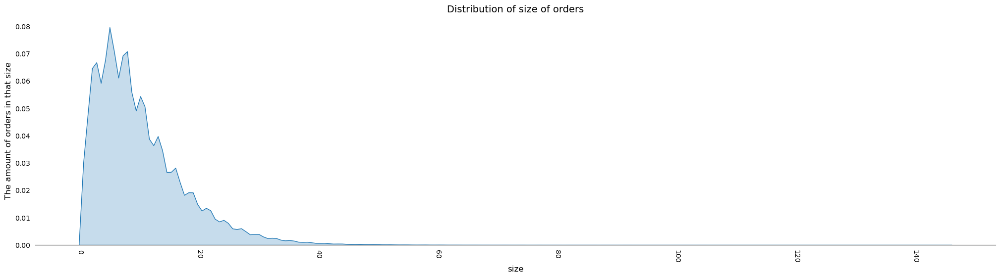

In [52]:
plt.figure(figsize=(25, 6))
sns.kdeplot(data=grouped['product_id'], fill=True, palette='Blues', common_norm=True)
plt.xticks(rotation =270)
plt.title('Distribution of size of orders', fontsize=14)
plt.xlabel('size', fontsize=12)
plt.ylabel('The amount of orders in that size', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

It can be seen that the sizes of most orders range from 1 to 20 and a few orders reach over 100, the avrage is 10 

In [53]:
# group dataset by reordered and count the number of observations in each reordered
grouped = order_products_prior.groupby('reordered').count()
freq = grouped['product_id'].values

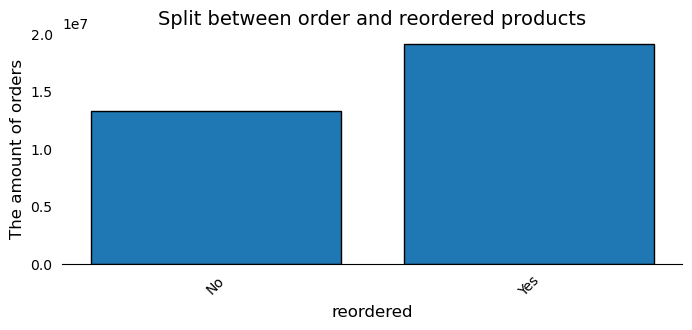

In [54]:
plt.figure(figsize=(8, 3))
plt.bar([0,1], freq, edgecolor='black')
plt.xticks([0,1],['No','Yes'],rotation=45)
plt.title('Split between order and reordered products', fontsize=14)
plt.xlabel('reordered', fontsize=12)
plt.ylabel('The amount of orders', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

It can be seen that most of the products have been reordered

In [55]:
#We now want to check if there is a difference between the average order size and the time during the day and week the order was done
orderSizeByTime = pd.merge(orders[orders['eval_set']=='prior'], order_products_prior, on='order_id')
orderSizeByTime = orderSizeByTime.groupby(['order_dow','order_hour_of_day', 'order_id', 'product_id']).count().reset_index()
orderSizeByTime = orderSizeByTime.groupby(['order_dow','order_hour_of_day', 'order_id']).sum().reset_index()
orderSizeByTime = orderSizeByTime.groupby(['order_dow','order_hour_of_day'])['user_id'].aggregate('mean')
orderSizeByTime = orderSizeByTime.to_frame().reset_index()

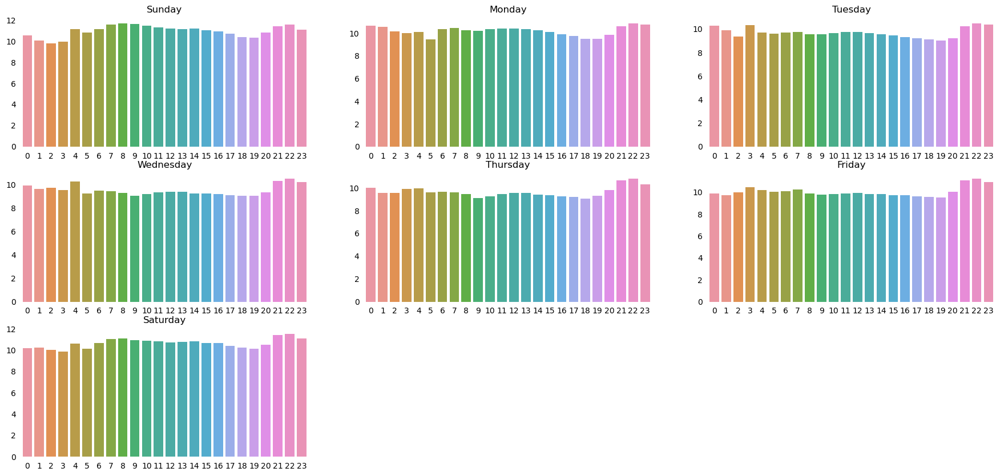

In [56]:
# plot barplots for each day
plt.figure(figsize=(22, 10))

for day in range(0,7):
    h1=day*24
    h2=day*24+23
    freq = orderSizeByTime.loc[h1:h2,'user_id'].reset_index().transpose().drop('index')
    plt.subplot(3, 3, day+1)
    sns.barplot(data=freq,ci=None)
    sns.despine(top=True, right=True, bottom=True, left=True)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
    plt.title(days[day])

order size is also very stable, keeping the average of 10 products per order througout the day and week

In [57]:
#We've shows how many products are in each department, we now check how many products are actually being ordered from each department
#merge product description into orders
merged = pd.merge(order_products_prior, products, left_on='product_id', right_on='product_id')

In [58]:
#merge user ID into orders
merged = pd.merge(merged, orders, left_on='order_id', right_on='order_id')
merged = merged.sort_values(['order_id','add_to_cart_order'])
productBaughtInDep = merged[['product_id', 'department_id']].groupby('department_id').count()
productBaughtInDep.rename(columns = {'product_id':'quantity'}, inplace = True)
productBaughtInDep = productBaughtInDep.sort_values(by = 'quantity', ascending = False)

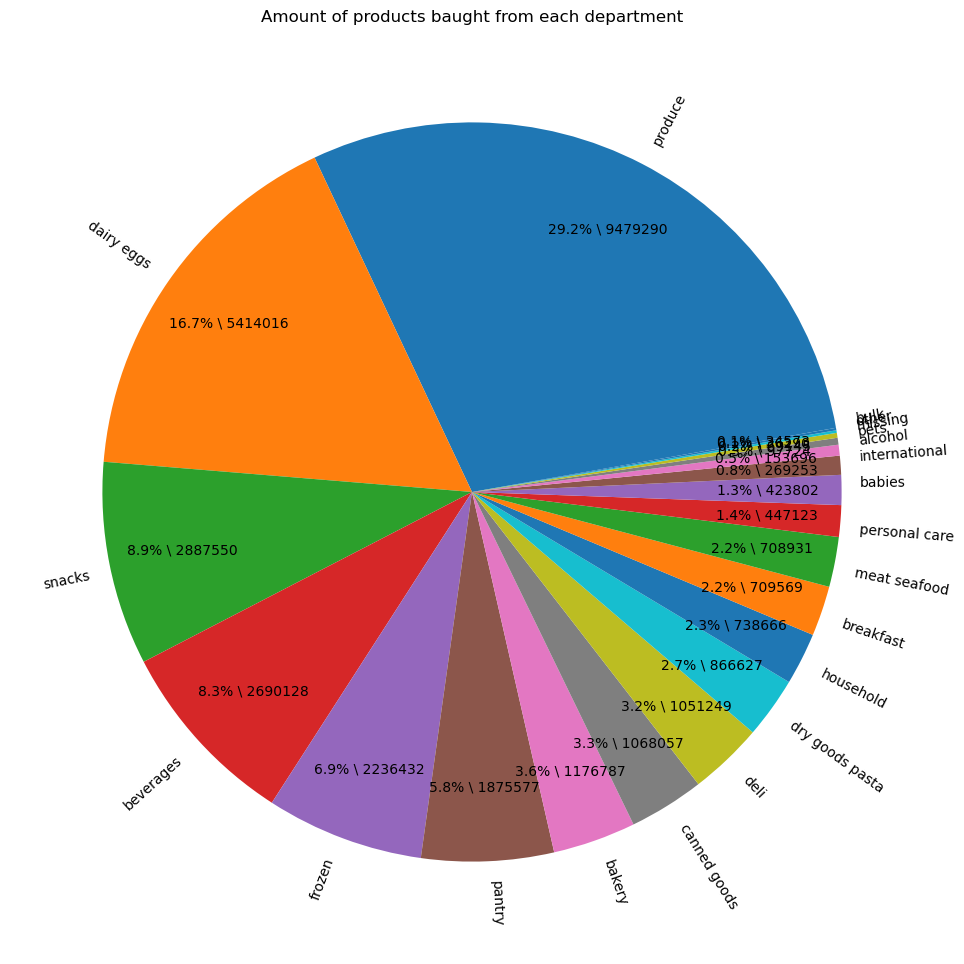

In [59]:
#pie chart to show the ratio of products baught by all users from each department
pieChartProductsBaught = pd.merge(productBaughtInDep, departments, on='department_id')
data = pieChartProductsBaught['quantity']
label = pieChartProductsBaught['department']
plt.figure(figsize = (12, 12))
plt.pie(data, labels = label, autopct = lambda pct: func(pct, data), textprops={'fontsize':10}, pctdistance=0.8, rotatelabels=True, labeldistance=1.05, startangle=10)
plt.title('Amount of products baught from each department')
plt.show()

It can be seen that the most products were ordered from the produce department, then from dairy products and eggs, and then from snacks. In contrast, almost no products were ordered from the other department, from the bulk department and from the missing department
There is no correlation between number of products in each department and the amount of orders from each department

The graph below shows that the higher the vareity in products does not necesarily mean Shufersal sells more from that department

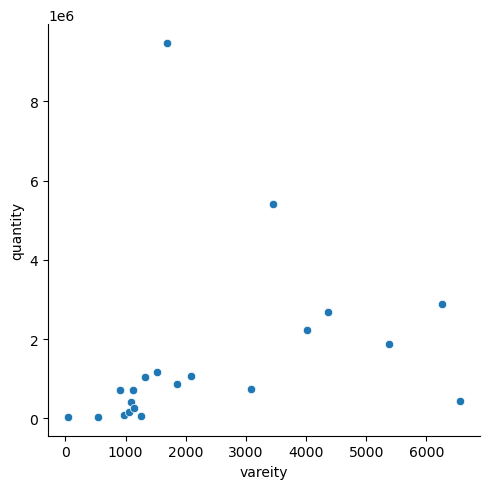

In [60]:
sns.relplot(data=pd.merge(pieChartProducts[['department_id', 'vareity']], pieChartProductsBaught[['department_id', 'quantity']], on='department_id'),
            x='vareity', y='quantity')

In [61]:
#Creating an integrated dataframe of orders and users
#to show division between the users (What are the order sizes for each user)
df=order_products_prior.copy().merge(orders, on='order_id')
grouped = df.groupby('user_id').count()

In [62]:
#Show statistics on the users
display(grouped.describe())

,order_id,product_id,add_to_cart_order,reordered,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
count,206209.000000,206209.000000,206209.000000,206209.000000,206209.000000,206209.000000,206209.000000,206209.000000,206209.000000
mean,157.289396,157.289396,157.289396,157.289396,157.289396,157.289396,157.289396,157.289396,147.211911
std,204.208233,204.208233,204.208233,204.208233,204.208233,204.208233,204.208233,204.208233,201.653853
min,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,2.000000
25%,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,39.000000,31.000000
50%,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,83.000000,73.000000
75%,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,176.000000
max,3725.000000,3725.000000,3725.000000,3725.000000,3725.000000,3725.000000,3725.000000,3725.000000,3636.000000


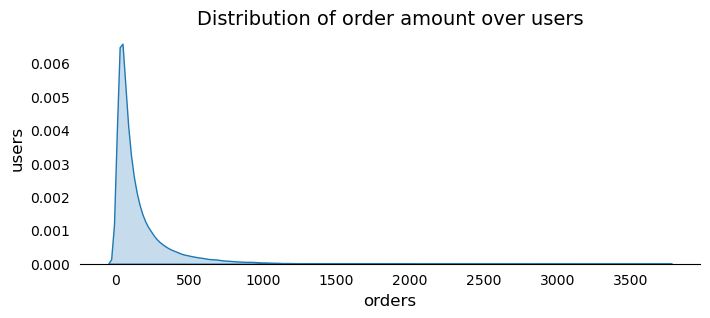

In [63]:
plt.figure(figsize=(8, 3))
sns.kdeplot(data=grouped['order_id'], fill=True, palette='Blues', common_norm=True)
plt.title('Distribution of order amount over users', fontsize=14)
plt.xlabel('orders', fontsize=12)
plt.ylabel('users', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

It can be seen that in total each customer bought between a single product and 3725 products with the majority between 1 and 200 and the average is 157

In [64]:
#We will check if there are any products that were not ordered at all
df=products.merge(order_products_prior, on='product_id',how='left')
df=df[df['order_id'].isna()]
print('The number of products that have never been ordered',len(df))
df.set_index('product_id')
df.index.name = 'product id'
df[['product_name', 'department_id']].sort_values(by='department_id')

The number of products that have never been ordered 11


,product_name,department_id
product id,,
29931983,Single Barrel Kentucky Straight Bourbon Whiskey,7
32284372,Pure Squeezed Lemonade,7
4043089,Unpeeled Apricot Halves in Heavy Syrup,13
1738025,Protein Granola Apple Crisp,14
1768779,Wasabi Cheddar Spreadable Cheese,16
24234095,Ultra Sun Blossom Liquid 90 loads Fabric Enhan...,17
29660201,12 Inch Taper Candle White,17
16270114,Chocolate Go Bites,19
17805646,Non-Dairy Coconut Seven Layer Bar,21


There are 11 products that have never been ordered
Note: These products will not be classified in the product classification section to avoid misleading the data

In [65]:
#Check what happens with departments by hour and day
#add products
groupedByDepartments = pd.merge(orders[orders['eval_set']=='prior'], order_products_prior, on='order_id')
groupedByDepartments = pd.merge(groupedByDepartments, products, on='product_id')

#Group each department and how many products each hour each day
groupedByDepartments = groupedByDepartments.groupby(['order_dow','order_hour_of_day', 'department_id']).count()

#Remove unneeded columns
groupedByDepartments = groupedByDepartments.drop(columns = ['user_id', 'eval_set', 'order_number', 'days_since_prior_order', 'product_id', 'add_to_cart_order',
                                                            'reordered', 'product_name', 'aisle_id'], axis = 1)

#rename columns
groupedByDepartments.rename(columns = {'order_id' : 'quantity'}, inplace = True)
groupedByDepartments

quantity
order_dow order_hour_of_day department_id          
0         0                 1                  2783
                            2                    41
                            3                  1301
                            4                 12716
                            5                    52
...                                             ...
6         23                17                 1218
                            18                  702
                            19                 4904
                            20                 1950
                            21                  141

[3528 rows x 1 columns]

In [66]:
#Transpose to have each deparment on a seperate columns
groupedByDepartments = groupedByDepartments.stack().unstack(2)

#Add total column
groupedByDepartments['total'] = groupedByDepartments.sum(axis = 1)
groupedByDepartments

department_id                             1    2     3      4    5     6  \
order_dow order_hour_of_day                                                
0         0                 quantity   2783   41  1301  12716   52   343   
          1                 quantity   1789   30   698   7059   39   233   
          2                 quantity    983   12   468   3919   26   135   
          3                 quantity    729    8   332   2645   27    73   
          4                 quantity    639   15   294   2515   37    80   
...                                     ...  ...   ...    ...  ...   ...   
6         19                quantity  13930  211  6056  49509  754  1409   
          20                quantity  10299  155  4450  39586  396  1110   
          21                quantity   7861   97  3691  35934  233   963   
          22                quantity   6489   92  2985  30322  163   833   
          23                quantity   4295   60  2171  20400  103   576   

department_id                             7    8     9   10  ...     13    14  \
order_dow order_hour_of_day                                  ...                
0         0                 quantity   2970  115  1035   33  ...   2340   721   
          1                 quantity   1815   60   654   25  ...   1377   515   
          2                 quantity   1010   35   342   15  ...    750   259   
          3                 quantity    748   33   208    9  ...    515   181   
          4                 quantity    720   30   208    8  ...    523   188   
...                                     ...  ...   ...  ...  ...    ...   ...   
6         19                quantity  14079  644  4651  175  ...  10275  3662   
          20                quantity   9663  342  3507  142  ...   7729  2820   
          21                quantity   7592  269  3127  110  ...   6418  2414   
          22                quantity   5931  150  2571  120  ...   5395  1955   
          23                quantity   4408  157  1765   89  ...   3613  1323   

department_id                           15     16    17    18     19    20  \
order_dow order_hour_of_day                                                  
0         0                 quantity  1312   6318   771   400   2954  1205   
          1                 quantity   789   3520   500   142   1656   646   
          2                 quantity   448   1982   314    93    981   395   
          3                 quantity   280   1430   224    60    711   273   
          4                 quantity   307   1285   240    68    606   255   
...                                    ...    ...   ...   ...    ...   ...   
6         19                quantity  5782  28277  3897  2179  14186  5324   
          20                quantity  4594  22028  2722  2036  10434  4101   
          21                quantity  3981  18991  2085  1953   8764  3408   
          22                quantity  3329  15108  1821  1268   6987  2887   
          23                quantity  2193  10540  1218   702   4904  1950   

department_id                          21   total  
order_dow order_hour_of_day                        
0         0                 quantity  123   38876  
          1                 quantity   81   22523  
          2                 quantity   32   12725  
          3                 quantity   28    8851  
          4                 quantity   31    8372  
...                                   ...     ...  
6         19                quantity  346  171797  
          20                quantity  310  131300  
          21                quantity  272  112219  
          22                quantity  227   91943  
          23                quantity  141   62844  

[168 rows x 22 columns]

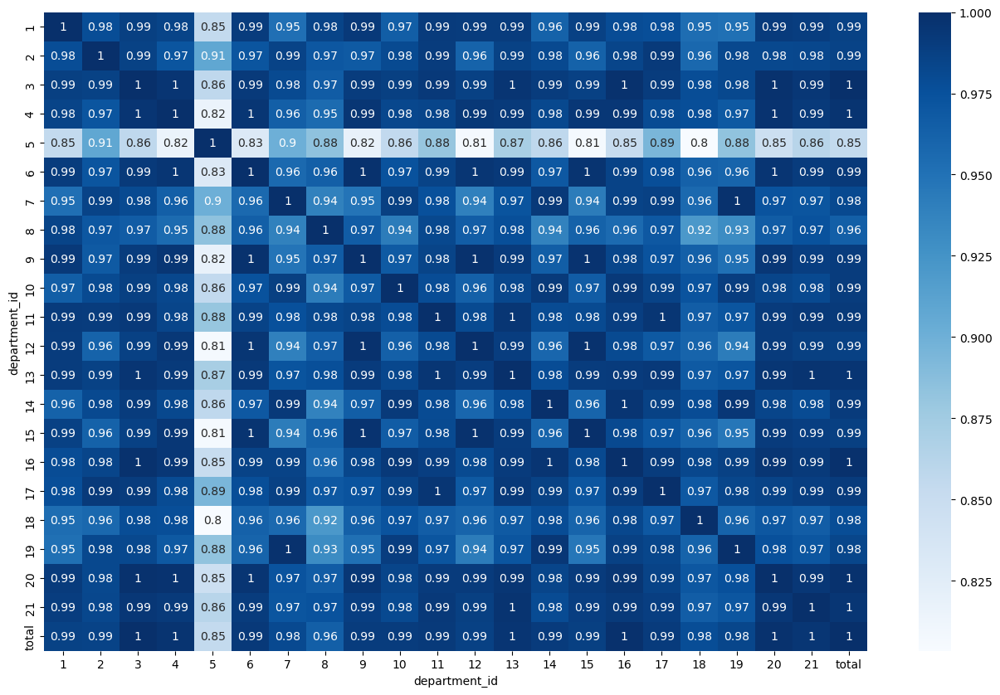

In [67]:
#Heat map to see correlation between departments
plt.figure(figsize=(16,10))
sns.heatmap(groupedByDepartments.corr(), annot = True, cmap = 'Blues')
plt.show()

In [68]:
departments[departments['department_id']==5]

,department_id,department
4,5,alcohol


Department 5 (Alcohol) have a different correlaction from all other departments

In [69]:
#from the heat map we can see that all departments besides alcohol have the same correlation, so we'll examine what happens with alcohol
groupedByDepartments = groupedByDepartments.reset_index()
groupedByDepartments = groupedByDepartments.groupby('order_dow').sum()
groupedByDepartments

department_id,order_hour_of_day,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,total
order_dow,,,,,,,,,,,,,,,,,,,,,
0,276,439144,6086,225382,1953784,17437,55728,433110,17151,182149,...,351950,127162,228161,1020167,126237,81622,483709,209526,13220,6209666
1,276,360790,5978,204386,1685056,20600,46394,482695,14526,147855,...,305068,129413,179995,957422,121267,73057,537636,184736,11378,5665856
2,276,282308,4969,152710,1198541,20325,34429,371531,11924,111066,...,240848,95858,132596,708983,100229,56698,399307,135582,8574,4217798
3,276,266237,4602,139410,1069260,22459,31540,344815,12589,98761,...,227591,87143,119361,641481,95575,52455,360898,122133,8312,3844117
4,276,260089,4563,137722,1052458,26142,29598,340146,12417,95849,...,225128,85445,115153,635983,93391,51568,357680,119669,8174,3787215
5,276,290980,5053,153850,1181596,27429,32836,376179,13704,103684,...,248719,94329,129185,712251,99366,51573,394519,134434,9415,4209533
6,276,336884,5040,163327,1338596,19304,38728,341653,15413,127263,...,276273,90219,163607,737729,102601,56829,353801,145169,10072,4500304


In [70]:
#create new DF to compare alcohol vs. total orders
alcoholVsTotal = []
alcoholVsTotal = pd.DataFrame(groupedByDepartments[5])
alcoholVsTotal.rename(columns = {5:'alcohol'}, inplace = True)
alcoholVsTotal['total'] = pd.DataFrame(groupedByDepartments['total'])
alcoholVsTotal

,alcohol,total
order_dow,,
0,17437,6209666
1,20600,5665856
2,20325,4217798
3,22459,3844117
4,26142,3787215
5,27429,4209533
6,19304,4500304


In [71]:
#normalize the data
for column in alcoholVsTotal.columns:
    alcoholVsTotal[column] = alcoholVsTotal[column] / alcoholVsTotal[column].abs().max()

alcoholVsTotal

,alcohol,total
order_dow,,
0,0.635714,1.000000
1,0.751030,0.912425
2,0.741004,0.679231
3,0.818805,0.619054
4,0.953079,0.609890
5,1.000000,0.677900
6,0.703781,0.724726


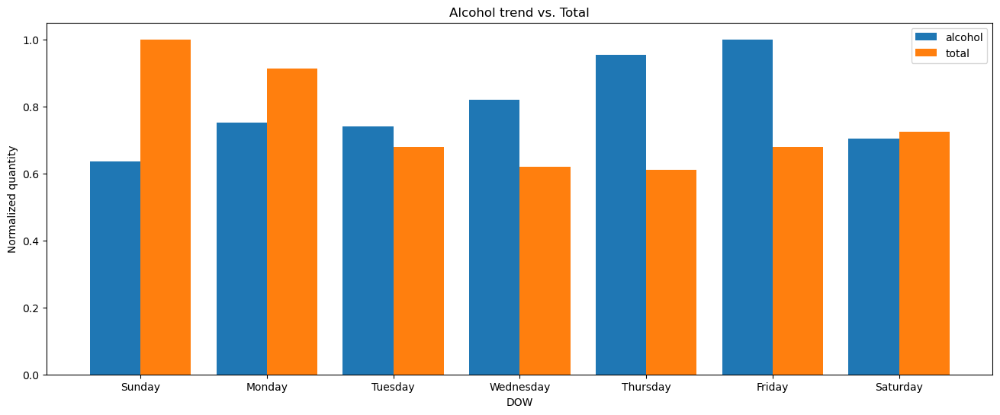

In [72]:
#plot bar graph to compare the trends
plt.figure(figsize=(16,6))
days=['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

x = alcoholVsTotal.index.values
y = alcoholVsTotal['alcohol']
z = alcoholVsTotal['total']
X_axis = np.arange(len(x))
plt.bar(X_axis-0.2, y, 0.4, label = 'alcohol')
plt.bar(X_axis+0.2, z, 0.4, label = 'total')

plt.xticks([0,1,2,3,4,5,6],days)
plt.xlabel("DOW")
plt.ylabel("Normalized quantity")
plt.title("Alcohol trend vs. Total")
plt.legend()
plt.show()

<h4>We will compare prior and train_test</h4>

In [73]:
# look at 5 random observations 
display(order_products_train_test.sample(5))

,order_id,product_id,add_to_cart_order,reordered
862285,2127653,31973,6,1
611723,1505572,25466,3,1
909880,2245986,36070,1,1
540216,1328678,25890,5,0
356897,868151,26209,2,1


In [74]:
# data shape (rows, columns)
print(order_products_train_test.shape)

(1384617, 4)


In [75]:
# variables data types
print(order_products_train_test.dtypes)

order_id             int64
product_id           int64
add_to_cart_order    int64
reordered            int64
dtype: object


In [76]:
# change order_id, product_id and reordered data type to int
order_products_train_test['order_id']=order_products_train_test['order_id'].astype('int32')
order_products_train_test['product_id']=order_products_train_test['product_id'].astype('int32')
order_products_train_test['reordered']=order_products_train_test['reordered'].astype('int8')
order_products_train_test['add_to_cart_order']=order_products_train_test['add_to_cart_order'].astype('int8')

In [77]:
display(order_products_train_test.isnull().sum())

order_id             0
product_id           0
add_to_cart_order    0
reordered            0
dtype: int64

In [78]:
# display descriptive statistics for numeric variables
display(order_products_train_test.describe())

,order_id,product_id,add_to_cart_order,reordered
count,1.384617e+06,1.384617e+06,1.384617e+06,1.384617e+06
mean,1.706298e+06,2.555624e+04,8.758044e+00,5.985944e-01
std,9.897326e+05,1.412127e+04,7.423936e+00,4.901829e-01
min,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00
25%,8.433700e+05,1.338000e+04,3.000000e+00,0.000000e+00
50%,1.701880e+06,2.529800e+04,7.000000e+00,1.000000e+00
75%,2.568023e+06,3.794000e+04,1.200000e+01,1.000000e+00
max,3.421070e+06,4.968800e+04,8.000000e+01,1.000000e+00


In [79]:
# group dataset by order_id and count the number of product in it
grouped = order_products_train_test.groupby('order_id').count()

In [80]:
#number of unique order numbers
grouped.shape

(131209, 3)

In [81]:
#average products per order
round(grouped['product_id'].mean(),3)

10.553

In [82]:
#display descriptive statistics for numeric variables
display(grouped.describe())

,product_id,add_to_cart_order,reordered
count,131209.000000,131209.000000,131209.000000
mean,10.552759,10.552759,10.552759
std,7.932847,7.932847,7.932847
min,1.000000,1.000000,1.000000
25%,5.000000,5.000000,5.000000
50%,9.000000,9.000000,9.000000
75%,14.000000,14.000000,14.000000
max,80.000000,80.000000,80.000000


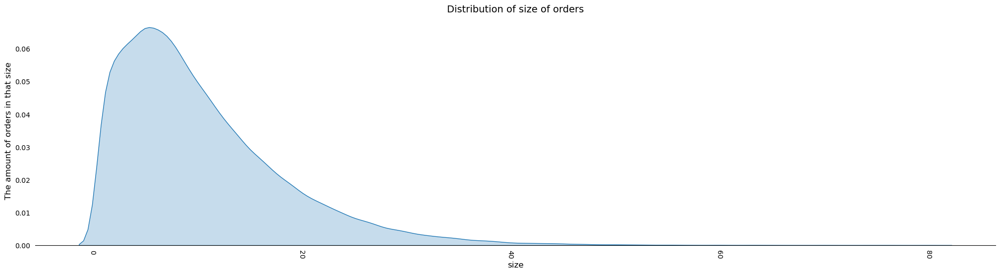

In [83]:
plt.figure(figsize=(25, 6))
sns.kdeplot(data=grouped['product_id'], fill=True, palette='Blues', common_norm=True)
plt.xticks(rotation =270)
plt.title('Distribution of size of orders', fontsize=14)
plt.xlabel('size', fontsize=12)
plt.ylabel('The amount of orders in that size', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

We will note that the order sizes are between 1 and 80 where the average is 10.5

In [84]:
# group dataset by reordered and count the number of observations in each reordered
grouped = order_products_train_test.groupby('reordered').count()
freq = grouped['order_id'].values

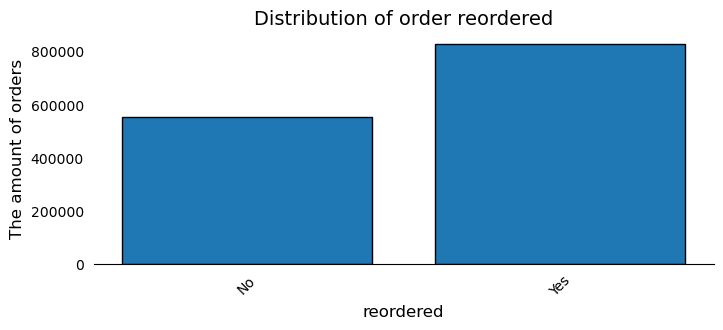

In [85]:
plt.figure(figsize=(8, 3))
plt.bar([0,1], freq, edgecolor='black')
plt.xticks([0,1],['No','Yes'],rotation=45)
plt.title('Distribution of order reordered', fontsize=14)
plt.xlabel('reordered', fontsize=12)
plt.ylabel('The amount of orders', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

It can be seen that most of the orders have been reordered

In [86]:
#We will examine the relationship between the size of the order and the time throughout the week
orderSizeByTime = pd.merge(orders, order_products_train_test, on='order_id')

In [87]:
orderSizeByTime = orderSizeByTime.groupby(['order_dow','order_hour_of_day', 'order_id', 'product_id']).count().reset_index()

In [88]:
orderSizeByTime = orderSizeByTime.groupby(['order_dow','order_hour_of_day', 'order_id']).sum().reset_index()

In [89]:
orderSizeByTime = orderSizeByTime.groupby(['order_dow','order_hour_of_day'])['user_id'].aggregate('mean')

In [90]:
orderSizeByTime = orderSizeByTime.to_frame().reset_index()

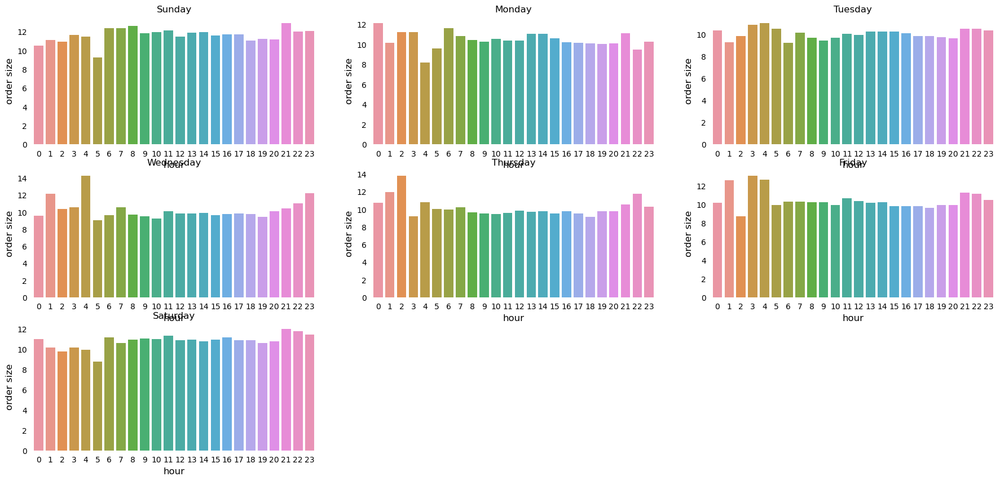

In [91]:
# plot barplots for each day

plt.figure(figsize=(22, 10))

for day in range(0,7):
    h1=day*24
    h2=day*24+23
    freq = orderSizeByTime.loc[h1:h2,'user_id'].reset_index().transpose().drop('index')
    plt.subplot(3, 3, day+1)
    sns.barplot(data=freq,ci=None)
    sns.despine(top=True, right=True, bottom=True, left=True)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
    plt.ylabel('order size', fontsize=12)
    plt.xlabel('hour', fontsize=12)
    plt.title(days[day])

order size is also very stable, keeping the average of 10 products per order throught the day

In [92]:
#merge product description into orders
merged = pd.merge(order_products_train_test, products, left_on='product_id', right_on='product_id')

In [93]:
#merge user ID into orders
merged = pd.merge(merged, orders, left_on='order_id', right_on='order_id')

In [94]:
merged = merged.sort_values(['order_id','add_to_cart_order'])

In [95]:
productBaughtInDep = merged[['product_id', 'department_id']].groupby('department_id').count()
productBaughtInDep.rename(columns = {'product_id':'quantity'}, inplace = True)
productBaughtInDep = productBaughtInDep.sort_values(by = 'quantity', ascending = False)

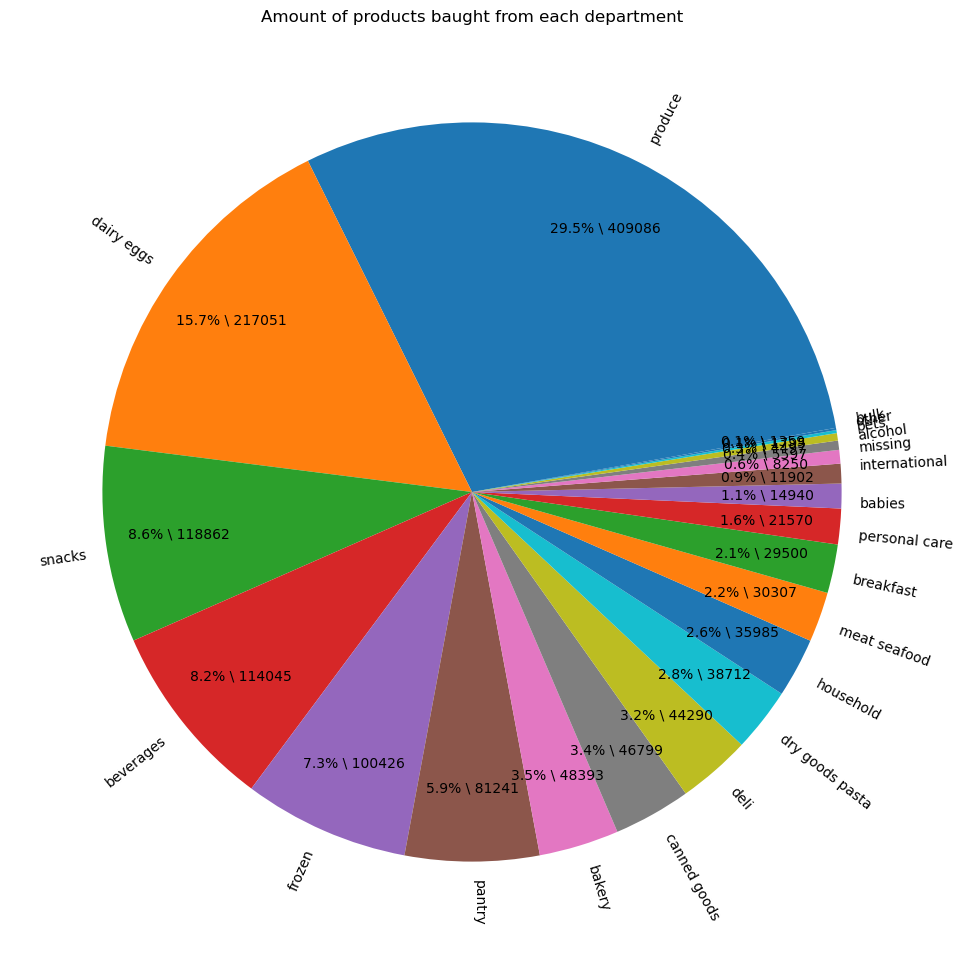

In [96]:
pieChartProductsBaught = pd.merge(productBaughtInDep, departments, on='department_id')
data = pieChartProductsBaught['quantity']
label = pieChartProductsBaught['department']
plt.figure(figsize = (12, 12))
plt.pie(data, labels = label, autopct = lambda pct: func(pct, data), textprops={'fontsize':10}, pctdistance=0.8, rotatelabels=True, labeldistance=1.05, startangle=10)
plt.title('Amount of products baught from each department')
plt.show()

It can be seen that the most products were ordered from the produce department, then from dairy products and eggs, and then from snacks. In contrast, almost no products were ordered from the other department, from the bulk department and from the missing department

In [97]:
#Creating an integrated dataframe of orders and users
#to show division between the users (What are the order sizes for each user)
df=order_products_train_test.merge(orders, on='order_id')
grouped = df.groupby('user_id').count()

In [98]:
#Show statistics on the users
display(grouped.describe())

,order_id,product_id,add_to_cart_order,reordered,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
count,131209.000000,131209.000000,131209.000000,131209.000000,131209.000000,131209.000000,131209.000000,131209.000000,131209.000000
mean,10.552759,10.552759,10.552759,10.552759,10.552759,10.552759,10.552759,10.552759,10.552759
std,7.932847,7.932847,7.932847,7.932847,7.932847,7.932847,7.932847,7.932847,7.932847
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
50%,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000
75%,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000


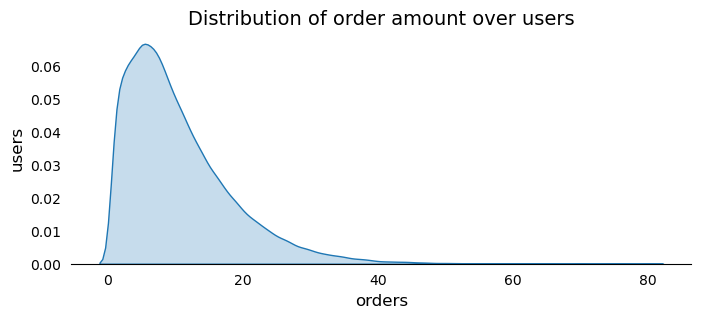

In [99]:
plt.figure(figsize=(8, 3))
sns.kdeplot(data=grouped['order_id'], fill=True, palette='Blues', common_norm=True)
plt.title('Distribution of order amount over users', fontsize=14)
plt.xlabel('orders', fontsize=12)
plt.ylabel('users', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

It can be seen that in total each customer bought between a single product and 80 products with the majority between 1 and 20 and the average is 10

<h6>You can see that there is no big difference between prior and train_test except for the amount of orders belonging to each (as we already checked when we visualized the division between the sets as they are hatched in orders)</h6>

<h2>target</h2>
This dataset contains the labels for each order and product combination of the train and test samples
<h6>Variables:</h6>
<ol>
    <li>order_id - Unique order id for every order</li>
    <li>product_id - product ID of item</li>
    <li>Was_In_order – indicates if a product was a part of a certain order or not (1/0)</li>
</ol>

In [100]:
# look at 5 random observations 
display(target.sample(5))

,order_id,product_id,was_in_order
2156552,1663920,33640.0,0
732857,522478,46692.0,1
592677,2489730,26369.0,1
3545,1312261,13176.0,1
201633,1640448,10644.0,1


In [101]:
# data shape (rows, columns)
print(target.shape)

(2959125, 3)


In [102]:
# variables data types
print(target.dtypes)

order_id          int64
product_id      float64
was_in_order      int64
dtype: object


In [103]:
# change order_id, product_id and reordered data type to int
target['order_id']=target['order_id'].astype('int32')
target['product_id']=target['product_id'].astype('int32')
target['was_in_order']=target['was_in_order'].astype('int8')

In [104]:
# group dataset by was_in_order and count the number of observations in each was_in_order
grouped = target.groupby('was_in_order').count()
freq = grouped['product_id'].values

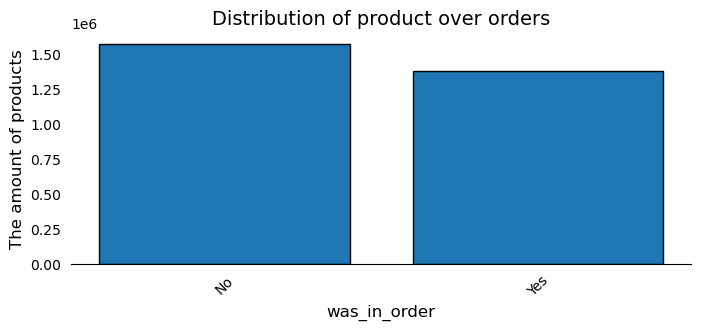

In [105]:
plt.figure(figsize=(8, 3))
plt.bar([0,1], freq, edgecolor='black')
plt.xticks([0,1],['No','Yes'],rotation=45)
plt.title('Distribution of product over orders', fontsize=14)
plt.xlabel('was_in_order', fontsize=12)
plt.ylabel('The amount of products', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

It can be seen that more products were not on order than were.

In [106]:
#deleting unneeded df and arrays
del grouped
del df
del freq
del merged
del pieChartProductsBaught
del productBaughtInDep
del label
del orderSizeByTime
del groupedByProducts
del pieChartProducts

<p id="2"><h1>Data Pre-Processing</h1>
In this section, I apply several pre-processing methods to the data in order to prepare it for the models that I wish to apply in the next section.</p>

<h2>feature engineering </h2>

<h3>We will build the following features:</h3>
<ol>
    <li><strong>weekday purchase frequency</strong> - This feature calculates the probability of a customer buying a certain product during a specific day of the week (calculate for each product). During prediction, we are given the day or the week the order was done and keep the frequency of the specific day</li>
    <li><strong>Product Purchase Frequency</strong> – This feature represents the number of times a customer has purchased a certain product in the past.</li>
    <li><strong>Product on Amount of Orders</strong> - This feature is similar to product purchase frequency, however, it looks at the inverval of between orders and not the total quantity as a whole, meaning that if a customer baught a specific product 5 times in 5 different orders (1 item each time) is not the same a a customer who had 5 orders and ordered 5 items of the same product in just one of those orders</li>
    <li><strong>Days Since Last Order</strong> - provides information on the time elapsed since the customer last bought a particular product in its past orders.</li>
    <li><strong>order size and product order size</strong> - compares between the average order size customers buys the product and the size of current order</li>
    <li><strong>probability to order unique product</strong> - represents how many products a customer baught only once from the total amount of products purchased</li>
    <li><strong>isPetOwnder</strong> - if a customer buys products from the pet department</li>
    <li><strong>isVegeterian</strong> - if a customer never baught a product from the meat/seafood departments</li>
    <li><strong>isPartent</strong> - if a customer buys from the baby department</li>
    <li><strong>drinksAlchohol</strong> - if a customer buys alchohol</li>
    <li><strong>order DOW</strong> - a given feature we're testing if can give some correlation</li>
    <li><strong>order hour of day</strong> - a given feature we're testing if can give some correlation. we've used feature transformation to group hours for morning, noon, evening and night</li>
    <li><strong>was in order</strong> - a given feature we're testing if can give some correlation</li>
</ol>

<h3>We will use transformation of features on:</h3>
<ol>
    <li><strong>weekday purchase frequency</strong> - one hot encoding on the day of week</li>
    <li><strong>isPetOwnder/isVegeterian/isPartent/drinksAlchohol</strong> - used one hot encoding</li>
    <li><strong>order hour of day</strong> - we've grouped hours for morning, noon, evening and night since during data exploration we've seen hours have trends which can be grouped </li>
    <li>We've normalized the data on each user to be used in PCA</li>
</ol>

<h3>We will use exclusion of features on:</h3>
<ol>
    <li>user ID</li>
    <li>product ID</li>
    <li>order ID</li>
    <li>During correlation checks we've seen that features "product on amount of orders" and "Product Purchase Frequency" had high correlation, so we've dropped one of them when classifing products</li></ol>
Some of the exclusion will be only after classification, and some before

<h3>We will use imputation of features on:</h3>
<ol>
    <li><strong>days since prior order</strong> - in some cases we've filled with zeros, and in some we've calculated and placed the mean of each group</li>
    <li><strong>products class</strong> - added a new cluster for NaN</li>
</ol>

Adding feature on probability to purchase a unique product

In [107]:
#create DF to perform all predictions
featuresDF = target.copy()
#Create DF for the Classification
ClassificationDF=order_products_prior.copy()

In [108]:
featuresDF

,order_id,product_id,was_in_order
0,1187899,196,1
1,2757217,196,1
2,632715,196,1
3,1167274,196,1
4,3347074,196,1
...,...,...,...
2959120,3421070,4987,0
2959121,3421070,8230,0
2959122,3421070,39468,0
2959123,3421070,39139,0


In [109]:
#remove duplicate values
featuresDF = featuresDF.drop_duplicates(keep='first')
ClassificationDF=ClassificationDF.drop_duplicates(keep='first')

In [110]:
featuresDF

,order_id,product_id,was_in_order
0,1187899,196,1
1,2757217,196,1
2,632715,196,1
3,1167274,196,1
4,3347074,196,1
...,...,...,...
2959120,3421070,4987,0
2959121,3421070,8230,0
2959122,3421070,39468,0
2959123,3421070,39139,0


In [111]:
#add which user made each order, adding only orders that where made in Target DF, use of inner
featuresDF = pd.merge(featuresDF, orders[['order_id', 'user_id']], how='inner', on='order_id')
ClassificationDF=pd.merge(ClassificationDF, orders[['order_id', 'user_id']], how='inner', on='order_id')

In [112]:
featuresDF = featuresDF[['order_id', 'user_id', 'product_id', 'was_in_order']]
ClassificationDF=ClassificationDF[['order_id', 'user_id', 'product_id']]

Adding feature on probability to purchase a unique product

In [113]:
#create DF with all products baught by a customer
orderNew = pd.merge(orders[orders['eval_set']=='prior'], order_products_prior, on='order_id')
orderNew

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered
0,2539329,1,prior,1,2,8,NaN,196,1,0
1,2539329,1,prior,1,2,8,NaN,14084,2,0
2,2539329,1,prior,1,2,8,NaN,12427,3,0
3,2539329,1,prior,1,2,8,NaN,26088,4,0
4,2539329,1,prior,1,2,8,NaN,26405,5,0
...,...,...,...,...,...,...,...,...,...,...
32434484,2977660,206209,prior,13,1,12,7.0,14197,5,1
32434485,2977660,206209,prior,13,1,12,7.0,38730,6,0
32434486,2977660,206209,prior,13,1,12,7.0,31477,7,0
32434487,2977660,206209,prior,13,1,12,7.0,6567,8,0


In [114]:
#remove usused fields
orderNew = orderNew.drop(['order_id', 'eval_set', 'order_number', 'order_dow', 'order_hour_of_day', 'days_since_prior_order', 'add_to_cart_order'], axis=1)
orderNew

,user_id,product_id,reordered
0,1,196,0
1,1,14084,0
2,1,12427,0
3,1,26088,0
4,1,26405,0
...,...,...,...
32434484,206209,14197,1
32434485,206209,38730,0
32434486,206209,31477,0
32434487,206209,6567,0


In [115]:
#creating a temp DF for all products a specific user baught only once
temp = orderNew.drop_duplicates(subset=['user_id', 'product_id'], keep=False)

In [116]:
#count number of unique products per user
temp = temp.groupby('user_id').count()
temp.rename(columns={'product_id':'unique products ordered'}, inplace = True)
temp = temp.drop(['reordered'], axis=1)
temp

,unique products ordered
user_id,
1,8
2,65
3,14
4,16
5,15
...,...
206205,17
206206,106
206207,44


In [117]:
#calculate how many products each custmer has baught in a new DF
tempTotal = orderNew.groupby('user_id').count()
tempTotal.rename(columns={'product_id':'total products ordered'}, inplace = True)
tempTotal = tempTotal.drop(['reordered'], axis=1)
tempTotal

,total products ordered
user_id,
1,59
2,195
3,88
4,18
5,37
...,...
206205,32
206206,285
206207,223


In [118]:
#merge both DFs, keeping also costumers who didn't order unique products
orderNew = pd.merge(temp, tempTotal, on='user_id', how='outer')
orderNew

,unique products ordered,total products ordered
user_id,,
1,8.0,59
2,65.0,195
3,14.0,88
4,16.0,18
5,15.0,37
...,...,...
205128,NaN,17
205225,NaN,9
205302,NaN,8


In [119]:
#if a user doesn't have a unique products then we fill NAN with 0
orderNew = orderNew.fillna(0)
orderNew

,unique products ordered,total products ordered
user_id,,
1,8.0,59
2,65.0,195
3,14.0,88
4,16.0,18
5,15.0,37
...,...,...
205128,0.0,17
205225,0.0,9
205302,0.0,8


In [120]:
#calculate the probabability to order a new product
orderNew['probability to order unique product'] = orderNew['unique products ordered']/orderNew['total products ordered']
orderNew

,unique products ordered,total products ordered,probability to order unique product
user_id,,,
1,8.0,59,0.135593
2,65.0,195,0.333333
3,14.0,88,0.159091
4,16.0,18,0.888889
5,15.0,37,0.405405
...,...,...,...
205128,0.0,17,0.000000
205225,0.0,9,0.000000
205302,0.0,8,0.000000


In [121]:
#Add the feature to featuresDF
featuresDF = pd.merge(featuresDF, orderNew['probability to order unique product'], on='user_id', how='left')
ClassificationDF= pd.merge(ClassificationDF, orderNew['probability to order unique product'], on='user_id', how='left')
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product
0,1187899,1,196,1,0.135593
1,1187899,1,26088,1,0.135593
2,1187899,1,26405,1,0.135593
3,1187899,1,10258,1,0.135593
4,1187899,1,13032,1,0.135593
...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000
2953140,2839453,170084,38434,0,1.000000
2953141,2839453,170084,10070,0,1.000000
2953142,2839453,170084,43006,0,1.000000


In [122]:
#deleting unused DFs
del orderNew
del temp
del tempTotal

Adding feature on average order size of product

In [123]:
#First step is to calculate the average order size
#make one DF of all orders
allOrders = order_products_prior.append(order_products_train_test)
#get order size
averageOrderForProduct = allOrders.groupby('order_id').max().drop(['product_id', 'reordered'], axis=1).reset_index()
averageOrderForProduct.rename(columns={'add_to_cart_order':'order size'}, inplace=True)
averageOrderForProduct

,order_id,order size
0,1,8
1,2,9
2,3,8
3,4,13
4,5,26
...,...,...
3346078,3421079,1
3346079,3421080,9
3346080,3421081,7
3346081,3421082,7


In [124]:
#DF the have each product and the order size he was in
productSize = pd.merge(allOrders, averageOrderForProduct, on='order_id')
productSize

,order_id,product_id,add_to_cart_order,reordered,order size
0,2,33120,1,1,9
1,2,28985,2,1,9
2,2,9327,3,0,9
3,2,45918,4,1,9
4,2,30035,5,0,9
...,...,...,...,...,...
33819101,3421063,14233,3,1,4
33819102,3421063,35548,4,1,4
33819103,3421070,35951,1,1,3
33819104,3421070,16953,2,1,3


In [125]:
#Now we calculate the average order size for each product
results = productSize.groupby('product_id')['order size'].mean().reset_index().rename(columns={'order size':'average order size'})
results

,product_id,average order size
0,1,9.832469
1,2,15.308511
2,3,13.247350
3,4,16.549858
4,5,11.750000
...,...,...
49680,49684,10.111111
49681,49685,14.612245
49682,49686,12.755906
49683,49687,13.571429


We have 49685 products, and we need to keep in mind that there are 49688 different products, meaning we don't have orders for three products

In [126]:
temp = pd.merge(averageOrderForProduct, featuresDF[['order_id','product_id']], on='order_id')
temp2=pd.merge(averageOrderForProduct, ClassificationDF[['order_id','product_id']], on='order_id')
temp

,order_id,order size,product_id
0,1,8,13176
1,1,8,47209
2,1,8,49683
3,1,8,22035
4,1,8,10246
...,...,...,...
2953139,3421070,3,4987
2953140,3421070,3,8230
2953141,3421070,3,39468
2953142,3421070,3,39139


In [127]:
#check if we have NaN values
temp.isna().sum()

order_id      0
order size    0
product_id    0
dtype: int64

In [128]:
#check if we have NaN values
temp2.isna().sum()

order_id      0
order size    0
product_id    0
dtype: int64

In [129]:
#Now we merge the average order size with the order size corresponding to that line
temp = pd.merge(results, temp, on='product_id')
temp2 = pd.merge(results, temp2, on='product_id')
temp

,product_id,average order size,order_id,order size
0,1,9.832469,6695,20
1,1,9.832469,10818,38
2,1,9.832469,41343,2
3,1,9.832469,48361,12
4,1,9.832469,63770,4
...,...,...,...,...
2953139,49688,15.688172,2584099,25
2953140,49688,15.688172,2631390,4
2953141,49688,15.688172,2865811,22
2953142,49688,15.688172,2895504,4


In [130]:
#Caclulate the diff between current order size and the average order size customers usually buy this product
temp['order size and product order size'] = temp['order size'] - temp['average order size']
temp2['order size and product order size'] = temp2['order size'] - temp2['average order size']
temp

,product_id,average order size,order_id,order size,order size and product order size
0,1,9.832469,6695,20,10.167531
1,1,9.832469,10818,38,28.167531
2,1,9.832469,41343,2,-7.832469
3,1,9.832469,48361,12,2.167531
4,1,9.832469,63770,4,-5.832469
...,...,...,...,...,...
2953139,49688,15.688172,2584099,25,9.311828
2953140,49688,15.688172,2631390,4,-11.688172
2953141,49688,15.688172,2865811,22,6.311828
2953142,49688,15.688172,2895504,4,-11.688172


In [131]:
#Add the feature to featuresDF
featuresDF = pd.merge(featuresDF, temp[['product_id', 'order_id', 'order size and product order size']], on=['product_id', 'order_id'])
ClassificationDF=pd.merge(ClassificationDF, temp2[['product_id', 'order_id', 'order size and product order size']], on=['product_id', 'order_id'],how='left')
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size
0,1187899,1,196,1,0.135593,3.736045
1,1187899,1,26088,1,0.135593,0.684844
2,1187899,1,26405,1,0.135593,6.369219
3,1187899,1,10258,1,0.135593,4.075122
4,1187899,1,13032,1,0.135593,1.471311
...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502292
2953140,2839453,170084,38434,0,1.000000,-13.528736
2953141,2839453,170084,10070,0,1.000000,-13.381804
2953142,2839453,170084,43006,0,1.000000,-15.666667


In [132]:
#deleting unused DFs
del temp
del temp2
del results
del productSize
del allOrders
del averageOrderForProduct

Product Purchase Frequency, This feature represents the number of times a customer has purchased a certain product in the past

In [133]:
#make a copy of prior orders and remove unneeded columns
productFreq = order_products_prior.copy()
productFreq = order_products_prior.drop(['add_to_cart_order', 'reordered'], axis = 1)
productFreq

,order_id,product_id
0,2,33120
1,2,28985
2,2,9327
3,2,45918
4,2,30035
...,...,...
32434484,3421083,39678
32434485,3421083,11352
32434486,3421083,4600
32434487,3421083,24852


In [134]:
#Merge with users data
productFreq = pd.merge(orders, productFreq, left_on='order_id', right_on='order_id', how='inner')
productFreq

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id
0,2539329,1,prior,1,2,8,NaN,196
1,2539329,1,prior,1,2,8,NaN,14084
2,2539329,1,prior,1,2,8,NaN,12427
3,2539329,1,prior,1,2,8,NaN,26088
4,2539329,1,prior,1,2,8,NaN,26405
...,...,...,...,...,...,...,...,...
32434484,2977660,206209,prior,13,1,12,7.0,14197
32434485,2977660,206209,prior,13,1,12,7.0,38730
32434486,2977660,206209,prior,13,1,12,7.0,31477
32434487,2977660,206209,prior,13,1,12,7.0,6567


In [135]:
#drop unneeded columns
productFreq = productFreq.drop(['order_dow', 'order_hour_of_day', 'days_since_prior_order', 'eval_set', 'order_number'], axis = 1)

In [136]:
productFreq

,order_id,user_id,product_id
0,2539329,1,196
1,2539329,1,14084
2,2539329,1,12427
3,2539329,1,26088
4,2539329,1,26405
...,...,...,...
32434484,2977660,206209,14197
32434485,2977660,206209,38730
32434486,2977660,206209,31477
32434487,2977660,206209,6567


In [137]:
#count how many times each user orderd a specific products
productFreq = productFreq.groupby(['user_id', 'product_id']).count().reset_index()
productFreq.rename(columns={'order_id':'product purchase frequency'}, inplace = True)
productFreq

,user_id,product_id,product purchase frequency
0,1,196,10
1,1,10258,9
2,1,10326,1
3,1,12427,10
4,1,13032,3
...,...,...,...
13307948,206209,43961,3
13307949,206209,44325,1
13307950,206209,48370,1
13307951,206209,48697,1


In [138]:
#merge with features DF
featuresDF = pd.merge(featuresDF, productFreq, on=['user_id', 'product_id'], how='left')
ClassificationDF=pd.merge(ClassificationDF, productFreq, on=['user_id', 'product_id'], how='left')
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency
0,1187899,1,196,1,0.135593,3.736045,10.0
1,1187899,1,26088,1,0.135593,0.684844,2.0
2,1187899,1,26405,1,0.135593,6.369219,2.0
3,1187899,1,10258,1,0.135593,4.075122,9.0
4,1187899,1,13032,1,0.135593,1.471311,3.0
...,...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502292,NaN
2953140,2839453,170084,38434,0,1.000000,-13.528736,NaN
2953141,2839453,170084,10070,0,1.000000,-13.381804,NaN
2953142,2839453,170084,43006,0,1.000000,-15.666667,NaN


In [139]:
#notice we have NaN values as if a customer didn't buy a product at our target data we don't have any previous info
#so we will mark it as 0 and the feature of probablity to order unique product will be more significat
featuresDF = featuresDF.fillna(0)
ClassificationDF=ClassificationDF.fillna(0)

In [140]:
#deleting unneeded DFs
del productFreq

Feature for assigning if someone is a vegeterian, a pet owner, a parent of a baby or drink alcohol

In [141]:
#We make a DF for all users, orders and the department they've baught. If they have purchased from "meat seafood" department they are not vegeterian
usersAndDepartments = pd.merge(orders[orders['eval_set']=='prior'], order_products_prior, on='order_id')
usersAndDepartments = usersAndDepartments.drop(['order_id', 'eval_set', 'order_number', 'order_dow', 'order_hour_of_day', 'days_since_prior_order', 'add_to_cart_order', 'reordered'], axis = 1)
usersAndDepartments

,user_id,product_id
0,1,196
1,1,14084
2,1,12427
3,1,26088
4,1,26405
...,...,...
32434484,206209,14197
32434485,206209,38730
32434486,206209,31477
32434487,206209,6567


In [142]:
#merge all departments and remove duplictes, we will be left with each user and all departments he has previously baught from
usersAndDepartments = pd.merge(usersAndDepartments, products[['product_id', 'department_id']], on='product_id')
usersAndDepartments = usersAndDepartments.drop(['product_id'], axis=1).drop_duplicates(keep='first')
usersAndDepartments

,user_id,department_id
0,1,7
10,15,7
15,19,7
18,21,7
19,31,7
...,...,...
32434437,186321,8
32434438,186870,8
32434445,189140,5
32434464,196359,5


In [143]:
#we look for pet owners which baught from pets department
petOwner = usersAndDepartments[usersAndDepartments['department_id']==8]
petOwner.rename(columns={'department_id':'isPetOwner'}, inplace=True)
petOwner['isPetOwner'] = petOwner['isPetOwner'].replace([8],1)
petOwner

,user_id,isPetOwner
5595781,7,1
5595782,4118,1
5595787,8925,1
5595788,11502,1
5595789,13804,1
...,...,...
32434215,159099,1
32434376,198745,1
32434377,205152,1
32434437,186321,1


In [144]:
#find all users who buys meat, they are not vegetarian and will be marked with 0
vegeterian = usersAndDepartments[usersAndDepartments['department_id']==12]
vegeterian.rename(columns={'department_id':'isVegeterian'}, inplace=True)
vegeterian['isVegeterian'] = vegeterian['isVegeterian'].replace([12],0)
vegeterian

,user_id,isVegeterian
2543321,2,0
2543322,434,0
2543323,643,0
2543324,704,0
2543325,968,0
...,...,...
32427213,125632,0
32431886,164533,0
32432388,108505,0
32432389,134990,0


In [145]:
#similarly we will do this with parents of a baby
parent = usersAndDepartments[usersAndDepartments['department_id']==18]
parent.rename(columns={'department_id':'isParent'}, inplace=True)
parent['isParent'] = parent['isParent'].replace([18],1)
parent

,user_id,isParent
6634373,9,1
6634374,720,1
6634375,901,1
6634376,1022,1
6634378,1890,1
...,...,...
32431637,156821,1
32432029,103959,1
32432030,118232,1
32432571,132967,1


In [146]:
#and with people who drink alcohol
alcohol = usersAndDepartments[usersAndDepartments['department_id']==5]
alcohol.rename(columns={'department_id':'drinksAlcohol'}, inplace=True)
alcohol['drinksAlcohol'] = alcohol['drinksAlcohol'].replace([5],1)
alcohol

,user_id,drinksAlcohol
4124301,4,1
4124302,4790,1
4124304,10726,1
4124307,11596,1
4124308,12191,1
...,...,...
32432744,152893,1
32433584,167198,1
32434040,163940,1
32434445,189140,1


In [147]:
#create DF of all users, we will insert the labels to this DF before merging with featuresDF
allUsers = usersAndDepartments[['user_id']].drop_duplicates(keep='first')
allUsers = allUsers.sort_values(by='user_id').reset_index(drop = True)
allUsers

,user_id
0,1
1,2
2,3
3,4
4,5
...,...
206204,206205
206205,206206
206206,206207
206207,206208


In [148]:
#now we merge all DFs, starting with pet owners
allUsers = pd.merge(allUsers, petOwner, on='user_id', how='left')
#adding 0 for all users not pet owners
allUsers = allUsers.fillna(0)

In [149]:
#now we merge vegeterians
allUsers = pd.merge(allUsers, vegeterian, on='user_id', how='left')
#adding 1 for all users which a vegeterian
allUsers = allUsers.fillna(1)

In [150]:
#partents of babies
allUsers = pd.merge(allUsers, parent, on='user_id', how='left')
#adding 0 for all users who are not parents of small babies
allUsers = allUsers.fillna(0)

In [151]:
#last but not least, people who drink alcohol
allUsers = pd.merge(allUsers, alcohol, on='user_id', how='left')
#adding 0 for all users who are not drinking alcohol
allUsers = allUsers.fillna(0)

In [152]:
#merge with featuresDF
featuresDF = pd.merge(featuresDF, allUsers, on='user_id')
ClassificationDF=pd.merge(ClassificationDF, allUsers, on='user_id')
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol
0,1187899,1,196,1,0.135593,3.736045,10.0,0.0,1.0,0.0,0.0
1,1187899,1,26088,1,0.135593,0.684844,2.0,0.0,1.0,0.0,0.0
2,1187899,1,26405,1,0.135593,6.369219,2.0,0.0,1.0,0.0,0.0
3,1187899,1,10258,1,0.135593,4.075122,9.0,0.0,1.0,0.0,0.0
4,1187899,1,13032,1,0.135593,1.471311,3.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502292,0.0,0.0,0.0,0.0,0.0
2953140,2839453,170084,38434,0,1.000000,-13.528736,0.0,0.0,0.0,0.0,0.0
2953141,2839453,170084,10070,0,1.000000,-13.381804,0.0,0.0,0.0,0.0,0.0
2953142,2839453,170084,43006,0,1.000000,-15.666667,0.0,0.0,0.0,0.0,0.0


In [153]:
#deleteing DFs
del allUsers
del parent
del vegeterian
del usersAndDepartments
del petOwner
del alcohol

Feature for weekly purchase probability - chance for a specific customer to buy a specific product

In [154]:
#merge to one DF 
df_prior=order_products_prior.merge(orders, on='order_id')
df_prior

,order_id,product_id,add_to_cart_order,reordered,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2,33120,1,1,202279,prior,3,5,9,8.0
1,2,28985,2,1,202279,prior,3,5,9,8.0
2,2,9327,3,0,202279,prior,3,5,9,8.0
3,2,45918,4,1,202279,prior,3,5,9,8.0
4,2,30035,5,0,202279,prior,3,5,9,8.0
...,...,...,...,...,...,...,...,...,...,...
32434484,3421083,39678,6,1,25247,prior,24,2,6,21.0
32434485,3421083,11352,7,0,25247,prior,24,2,6,21.0
32434486,3421083,4600,8,0,25247,prior,24,2,6,21.0
32434487,3421083,24852,9,1,25247,prior,24,2,6,21.0


In [155]:
#drop unneeded columns
df=df_prior.drop(['order_id','order_number','add_to_cart_order','reordered','eval_set','order_hour_of_day','days_since_prior_order'],axis=1)
df

,product_id,user_id,order_dow
0,33120,202279,5
1,28985,202279,5
2,9327,202279,5
3,45918,202279,5
4,30035,202279,5
...,...,...,...
32434484,39678,25247,2
32434485,11352,25247,2
32434486,4600,25247,2
32434487,24852,25247,2


In [156]:
#get_dummies for dow
dummies = pd.get_dummies(df['order_dow'])
df.drop('order_dow',axis=1,inplace=True)
df=pd.concat([df,dummies],axis=1)
df

,product_id,user_id,0,1,2,3,4,5,6
0,33120,202279,0,0,0,0,0,1,0
1,28985,202279,0,0,0,0,0,1,0
2,9327,202279,0,0,0,0,0,1,0
3,45918,202279,0,0,0,0,0,1,0
4,30035,202279,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...
32434484,39678,25247,0,0,1,0,0,0,0
32434485,11352,25247,0,0,1,0,0,0,0
32434486,4600,25247,0,0,1,0,0,0,0
32434487,24852,25247,0,0,1,0,0,0,0


In [157]:
grouped = df.groupby(['user_id', 'product_id']).sum().reset_index()
grouped

,user_id,product_id,0,1,2,3,4,5,6
0,1,196,0,3,2,2,3,0,0
1,1,10258,0,3,1,2,3,0,0
2,1,10326,0,0,0,0,1,0,0
3,1,12427,0,3,2,2,3,0,0
4,1,13032,0,1,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...
13307948,206209,43961,0,2,0,1,0,0,0
13307949,206209,44325,0,0,1,0,0,0,0
13307950,206209,48370,0,0,0,0,1,0,0
13307951,206209,48697,0,0,1,0,0,0,0


In [158]:
#Calculation of how many products were ordered in total
grouped['Product_Purchase_Frequency']=grouped[0]+grouped[1]+grouped[2]+grouped[3]+grouped[4]+grouped[5]+grouped[6]
grouped

,user_id,product_id,0,1,2,3,4,5,6,Product_Purchase_Frequency
0,1,196,0,3,2,2,3,0,0,10
1,1,10258,0,3,1,2,3,0,0,9
2,1,10326,0,0,0,0,1,0,0,1
3,1,12427,0,3,2,2,3,0,0,10
4,1,13032,0,1,0,1,1,0,0,3
...,...,...,...,...,...,...,...,...,...,...
13307948,206209,43961,0,2,0,1,0,0,0,3
13307949,206209,44325,0,0,1,0,0,0,0,1
13307950,206209,48370,0,0,0,0,1,0,0,1
13307951,206209,48697,0,0,1,0,0,0,0,1


In [159]:
#Converting the columns of the days to float so that they can keep the proportion
for i in range(7):
    grouped[i]=grouped[i].astype('float32')

In [160]:
#Calculation of the proportion for each day
for i in range(7):
    grouped[i]=grouped[i]/grouped['Product_Purchase_Frequency']
grouped

,user_id,product_id,0,1,2,3,4,5,6,Product_Purchase_Frequency
0,1,196,0.0,0.300000,0.200000,0.200000,0.300000,0.0,0.0,10
1,1,10258,0.0,0.333333,0.111111,0.222222,0.333333,0.0,0.0,9
2,1,10326,0.0,0.000000,0.000000,0.000000,1.000000,0.0,0.0,1
3,1,12427,0.0,0.300000,0.200000,0.200000,0.300000,0.0,0.0,10
4,1,13032,0.0,0.333333,0.000000,0.333333,0.333333,0.0,0.0,3
...,...,...,...,...,...,...,...,...,...,...
13307948,206209,43961,0.0,0.666667,0.000000,0.333333,0.000000,0.0,0.0,3
13307949,206209,44325,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.0,1
13307950,206209,48370,0.0,0.000000,0.000000,0.000000,1.000000,0.0,0.0,1
13307951,206209,48697,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.0,1


In [161]:
#create DF for converting the frequency to the actual DOW the order was made, so first we need to add the order DOW to feature DF
temp = pd.merge(featuresDF, orders[['order_id', 'order_dow']], on='order_id')

In [162]:
#adding the frequency we've calculated
temp = pd.merge(temp, grouped, on=['user_id', 'product_id'], how='left')
temp = temp.drop(['probability to order unique product', 'order size and product order size', 'product purchase frequency', 'isPetOwner', 'Product_Purchase_Frequency',
                  'drinksAlcohol', 'isParent', 'isVegeterian', 'order_id', 'was_in_order'], axis=1)
temp

,user_id,product_id,order_dow,0,1,2,3,4,5,6
0,1,196,4,0.0,0.300000,0.200000,0.200000,0.300000,0.0,0.0
1,1,26088,4,0.0,0.000000,0.500000,0.500000,0.000000,0.0,0.0
2,1,26405,4,0.0,0.000000,0.500000,0.000000,0.500000,0.0,0.0
3,1,10258,4,0.0,0.333333,0.111111,0.222222,0.333333,0.0,0.0
4,1,13032,4,0.0,0.333333,0.000000,0.333333,0.333333,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2953139,170084,45066,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2953140,170084,38434,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2953141,170084,10070,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2953142,170084,43006,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [163]:
#there are many products a customer didn't buy, so we don't have the frequency
temp.isna().sum()

user_id             0
product_id          0
order_dow           0
0             2076959
1             2076959
2             2076959
3             2076959
4             2076959
5             2076959
6             2076959
dtype: int64

In [164]:
#deleting all these rows
temp.dropna(inplace=True)
temp

,user_id,product_id,order_dow,0,1,2,3,4,5,6
0,1,196,4,0.0,0.300000,0.200000,0.200000,0.300000,0.000000,0.000000
1,1,26088,4,0.0,0.000000,0.500000,0.500000,0.000000,0.000000,0.000000
2,1,26405,4,0.0,0.000000,0.500000,0.000000,0.500000,0.000000,0.000000
3,1,10258,4,0.0,0.333333,0.111111,0.222222,0.333333,0.000000,0.000000
4,1,13032,4,0.0,0.333333,0.000000,0.333333,0.333333,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
2953006,158470,47209,4,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
2953057,118037,28204,0,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
2953066,138011,37308,3,0.0,0.000000,0.000000,0.333333,0.000000,0.333333,0.333333
2953092,184308,27300,5,0.0,0.000000,0.000000,0.625000,0.250000,0.125000,0.000000


In [165]:
#due to the large scale of data, we need to create a function to convert between the order DOW and the weekly frequency we've calculated
def addFreq(row):
    return row[row['order_dow']]

In [166]:
temp['weekday purchase frequency']=temp.apply(lambda row: addFreq(row), axis=1)
temp

,user_id,product_id,order_dow,0,1,2,3,4,5,6,weekday purchase frequency
0,1,196,4,0.0,0.300000,0.200000,0.200000,0.300000,0.000000,0.000000,0.300000
1,1,26088,4,0.0,0.000000,0.500000,0.500000,0.000000,0.000000,0.000000,0.000000
2,1,26405,4,0.0,0.000000,0.500000,0.000000,0.500000,0.000000,0.000000,0.500000
3,1,10258,4,0.0,0.333333,0.111111,0.222222,0.333333,0.000000,0.000000,0.333333
4,1,13032,4,0.0,0.333333,0.000000,0.333333,0.333333,0.000000,0.000000,0.333333
...,...,...,...,...,...,...,...,...,...,...,...
2953006,158470,47209,4,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
2953057,118037,28204,0,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2953066,138011,37308,3,0.0,0.000000,0.000000,0.333333,0.000000,0.333333,0.333333,0.333333
2953092,184308,27300,5,0.0,0.000000,0.000000,0.625000,0.250000,0.125000,0.000000,0.125000


In [167]:
featuresDF = pd.merge(featuresDF, temp[['user_id', 'product_id', 'weekday purchase frequency']], on=['user_id', 'product_id'], how='left')
ClassificationDF=pd.merge(ClassificationDF, temp[['user_id', 'product_id', 'weekday purchase frequency']], on=['user_id', 'product_id'], how='left')
#adding zeroes where we don't have information on weekly purchase frequency since the customer never baught them - type of imputation
featuresDF.fillna(0)
ClassificationDF.fillna(0)

,order_id,user_id,product_id,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency
0,2,202279,33120,0.344444,-5.604478,5,0.0,1.0,0.0,0.0,0.0
1,2,202279,28985,0.344444,-6.992051,5,0.0,1.0,0.0,0.0,0.0
2,2,202279,9327,0.344444,-7.329883,1,0.0,1.0,0.0,0.0,0.0
3,2,202279,45918,0.344444,-5.617048,5,0.0,1.0,0.0,0.0,0.0
4,2,202279,30035,0.344444,-4.774576,3,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
32434484,3347806,179441,42615,0.428571,-8.751105,1,0.0,0.0,0.0,0.0,0.0
32434485,3347806,179441,25890,0.428571,-7.456663,1,0.0,0.0,0.0,0.0,0.0
32434486,3347806,179441,16797,0.428571,-7.115849,2,0.0,0.0,0.0,0.0,0.0
32434487,3347806,179441,35221,0.428571,-7.859272,2,0.0,0.0,0.0,0.0,0.0


In [168]:
#deleting unneeded DFs
del temp
del grouped
del df
del df_prior

Feature of how many orders contain a specific product. Until now we've addresses the total quantity ordered, but not the amount relative to all of it's orders

In [169]:
#make a copy of prior orders and remove unneeded columns
productFreq = order_products_prior.copy()
productFreq = order_products_prior.drop(['add_to_cart_order', 'reordered'], axis = 1)
productFreq

,order_id,product_id
0,2,33120
1,2,28985
2,2,9327
3,2,45918
4,2,30035
...,...,...
32434484,3421083,39678
32434485,3421083,11352
32434486,3421083,4600
32434487,3421083,24852


In [170]:
#Merge with users data
productFreq = pd.merge(orders, productFreq, left_on='order_id', right_on='order_id', how='inner')
productFreq

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id
0,2539329,1,prior,1,2,8,NaN,196
1,2539329,1,prior,1,2,8,NaN,14084
2,2539329,1,prior,1,2,8,NaN,12427
3,2539329,1,prior,1,2,8,NaN,26088
4,2539329,1,prior,1,2,8,NaN,26405
...,...,...,...,...,...,...,...,...
32434484,2977660,206209,prior,13,1,12,7.0,14197
32434485,2977660,206209,prior,13,1,12,7.0,38730
32434486,2977660,206209,prior,13,1,12,7.0,31477
32434487,2977660,206209,prior,13,1,12,7.0,6567


In [171]:
#drop unneeded columns
productFreq = productFreq.drop(['order_dow', 'order_hour_of_day', 'days_since_prior_order', 'eval_set'], axis = 1)

In [172]:
productFreq

,order_id,user_id,order_number,product_id
0,2539329,1,1,196
1,2539329,1,1,14084
2,2539329,1,1,12427
3,2539329,1,1,26088
4,2539329,1,1,26405
...,...,...,...,...
32434484,2977660,206209,13,14197
32434485,2977660,206209,13,38730
32434486,2977660,206209,13,31477
32434487,2977660,206209,13,6567


In [173]:
#count on how many orders each user orderd a specific products
productFreq = productFreq.groupby(['user_id', 'product_id', 'order_id']).count().reset_index()
productFreq.rename(columns={'order_number':'product purchase in each order'}, inplace = True)
productFreq

,user_id,product_id,order_id,product purchase in each order
0,1,196,431534,1
1,1,196,473747,1
2,1,196,550135,1
3,1,196,2254736,1
4,1,196,2295261,1
...,...,...,...,...
32434484,206209,44325,550836,1
32434485,206209,48370,1854736,1
32434486,206209,48697,550836,1
32434487,206209,48742,550836,1


In [174]:
productFreq = productFreq.groupby(['user_id', 'product_id'])['product purchase in each order'].sum().reset_index()

In [175]:
#now we need the total number of orders a user had made
ordersByCustomer = pd.merge(orders[orders['eval_set']=='prior'], order_products_prior, on='order_id')
ordersByCustomer = ordersByCustomer.drop(['eval_set', 'order_dow', 'order_hour_of_day', 'days_since_prior_order', 'product_id', 'add_to_cart_order', 'reordered'], axis=1)
ordersByCustomer

,order_id,user_id,order_number
0,2539329,1,1
1,2539329,1,1
2,2539329,1,1
3,2539329,1,1
4,2539329,1,1
...,...,...,...
32434484,2977660,206209,13
32434485,2977660,206209,13
32434486,2977660,206209,13
32434487,2977660,206209,13


In [176]:
#group by users and take the max order number
ordersByCustomer = ordersByCustomer.groupby(['user_id'])['order_number'].max().reset_index()
ordersByCustomer.rename(columns={'order_number':'number of orders'}, inplace=True)
ordersByCustomer

,user_id,number of orders
0,1,10
1,2,14
2,3,12
3,4,5
4,5,4
...,...,...
206204,206205,3
206205,206206,67
206206,206207,16
206207,206208,49


In [177]:
#merge both DFs
productFreq = pd.merge(productFreq, ordersByCustomer, on='user_id')

In [178]:
productFreq

,user_id,product_id,product purchase in each order,number of orders
0,1,196,10,10
1,1,10258,9,10
2,1,10326,1,10
3,1,12427,10,10
4,1,13032,3,10
...,...,...,...,...
13307948,206209,43961,3,13
13307949,206209,44325,1,13
13307950,206209,48370,1,13
13307951,206209,48697,1,13


In [179]:
#calculate the probability a product will be ordered in each order
productFreq['product on amount of orders']=productFreq['product purchase in each order']/productFreq['number of orders']
productFreq

,user_id,product_id,product purchase in each order,number of orders,product on amount of orders
0,1,196,10,10,1.000000
1,1,10258,9,10,0.900000
2,1,10326,1,10,0.100000
3,1,12427,10,10,1.000000
4,1,13032,3,10,0.300000
...,...,...,...,...,...
13307948,206209,43961,3,13,0.230769
13307949,206209,44325,1,13,0.076923
13307950,206209,48370,1,13,0.076923
13307951,206209,48697,1,13,0.076923


In [180]:
#merging to featuresDF
featuresDF=pd.merge(featuresDF, productFreq[['user_id', 'product_id', 'product on amount of orders']], on=['user_id', 'product_id'], how='left')
ClassificationDF=pd.merge(ClassificationDF, productFreq[['user_id', 'product_id', 'product on amount of orders']], on=['user_id', 'product_id'], how='left')
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency,product on amount of orders
0,1187899,1,196,1,0.135593,3.736045,10.0,0.0,1.0,0.0,0.0,0.300000,1.0
1,1187899,1,26088,1,0.135593,0.684844,2.0,0.0,1.0,0.0,0.0,0.000000,0.2
2,1187899,1,26405,1,0.135593,6.369219,2.0,0.0,1.0,0.0,0.0,0.500000,0.2
3,1187899,1,10258,1,0.135593,4.075122,9.0,0.0,1.0,0.0,0.0,0.333333,0.9
4,1187899,1,13032,1,0.135593,1.471311,3.0,0.0,1.0,0.0,0.0,0.333333,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502292,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2953140,2839453,170084,38434,0,1.000000,-13.528736,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2953141,2839453,170084,10070,0,1.000000,-13.381804,0.0,0.0,0.0,0.0,0.0,NaN,NaN
2953142,2839453,170084,43006,0,1.000000,-15.666667,0.0,0.0,0.0,0.0,0.0,NaN,NaN


In [181]:
#similar to the product purchase frequency we need to fill with zeros where there is not info
featuresDF=featuresDF.fillna(0)
ClassificationDF=ClassificationDF.fillna(0)
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency,product on amount of orders
0,1187899,1,196,1,0.135593,3.736045,10.0,0.0,1.0,0.0,0.0,0.300000,1.0
1,1187899,1,26088,1,0.135593,0.684844,2.0,0.0,1.0,0.0,0.0,0.000000,0.2
2,1187899,1,26405,1,0.135593,6.369219,2.0,0.0,1.0,0.0,0.0,0.500000,0.2
3,1187899,1,10258,1,0.135593,4.075122,9.0,0.0,1.0,0.0,0.0,0.333333,0.9
4,1187899,1,13032,1,0.135593,1.471311,3.0,0.0,1.0,0.0,0.0,0.333333,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502292,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2953140,2839453,170084,38434,0,1.000000,-13.528736,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2953141,2839453,170084,10070,0,1.000000,-13.381804,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2953142,2839453,170084,43006,0,1.000000,-15.666667,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [182]:
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency,product on amount of orders
0,1187899,1,196,1,0.135593,3.736045,10.0,0.0,1.0,0.0,0.0,0.300000,1.0
1,1187899,1,26088,1,0.135593,0.684844,2.0,0.0,1.0,0.0,0.0,0.000000,0.2
2,1187899,1,26405,1,0.135593,6.369219,2.0,0.0,1.0,0.0,0.0,0.500000,0.2
3,1187899,1,10258,1,0.135593,4.075122,9.0,0.0,1.0,0.0,0.0,0.333333,0.9
4,1187899,1,13032,1,0.135593,1.471311,3.0,0.0,1.0,0.0,0.0,0.333333,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502292,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2953140,2839453,170084,38434,0,1.000000,-13.528736,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2953141,2839453,170084,10070,0,1.000000,-13.381804,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2953142,2839453,170084,43006,0,1.000000,-15.666667,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [183]:
#in order to emphasise that product purchase frequency is not the same as product on amount of orders
#since if a customer purchsed more than one of the same product on the same order, we will have a different result
featuresDF[featuresDF['product purchase frequency']!=(featuresDF['product on amount of orders']*10)]

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency,product on amount of orders
23,2757217,67,196,1,0.135802,-4.263955,19.0,0.0,1.0,0.0,0.0,0.052632,0.791667
24,2757217,67,13176,1,0.135802,-10.749439,14.0,0.0,1.0,0.0,0.0,0.071429,0.583333
25,2757217,67,6184,1,0.135802,-4.397931,8.0,0.0,1.0,0.0,0.0,0.000000,0.333333
38,632715,676,196,1,0.263158,-4.263955,7.0,0.0,1.0,0.0,0.0,0.285714,0.636364
39,632715,676,21386,1,0.263158,-5.777750,1.0,0.0,1.0,0.0,0.0,0.000000,0.090909
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953006,525575,158470,47209,0,0.891892,-14.659082,1.0,0.0,1.0,0.0,0.0,0.000000,0.083333
2953057,1394480,118037,28204,0,1.000000,-13.875895,1.0,0.0,1.0,0.0,0.0,0.000000,0.333333
2953066,1390836,138011,37308,1,0.720000,-6.250000,3.0,0.0,1.0,0.0,0.0,0.333333,0.375000
2953092,2755627,184308,27300,1,0.296000,-10.800000,8.0,0.0,0.0,1.0,0.0,0.125000,0.666667


In [184]:
#deleting unneeded DFs
del productFreq
del ordersByCustomer

Feature Days Since Last Order

In [185]:
#first step is to calculate the elapsed time for each user between the first to last order he made
elapsed = pd.merge(orders[orders['eval_set']=='prior'], order_products_prior, on='order_id')
elapsed = elapsed.drop(['eval_set', 'order_dow', 'order_hour_of_day', 'add_to_cart_order', 'reordered'], axis=1)
elapsed

,order_id,user_id,order_number,days_since_prior_order,product_id
0,2539329,1,1,NaN,196
1,2539329,1,1,NaN,14084
2,2539329,1,1,NaN,12427
3,2539329,1,1,NaN,26088
4,2539329,1,1,NaN,26405
...,...,...,...,...,...
32434484,2977660,206209,13,7.0,14197
32434485,2977660,206209,13,7.0,38730
32434486,2977660,206209,13,7.0,31477
32434487,2977660,206209,13,7.0,6567


In [186]:
#fill nulls with zero, since it's the first order the time is zero
elapsed = elapsed.fillna(0)
elapsed

,order_id,user_id,order_number,days_since_prior_order,product_id
0,2539329,1,1,0.0,196
1,2539329,1,1,0.0,14084
2,2539329,1,1,0.0,12427
3,2539329,1,1,0.0,26088
4,2539329,1,1,0.0,26405
...,...,...,...,...,...
32434484,2977660,206209,13,7.0,14197
32434485,2977660,206209,13,7.0,38730
32434486,2977660,206209,13,7.0,31477
32434487,2977660,206209,13,7.0,6567


In [187]:
#group each user and the orders he made, need one row per order, then sort by the order number from first to last
orderGaps = elapsed[['user_id', 'order_number', 'days_since_prior_order']].drop_duplicates()
orderGaps = orderGaps.sort_values(by=['user_id', 'order_number'])
orderGaps

,user_id,order_number,days_since_prior_order
0,1,1,0.0
5,1,2,15.0
11,1,3,21.0
16,1,4,29.0
21,1,5,28.0
...,...,...,...
32434440,206209,9,22.0
32434443,206209,10,29.0
32434452,206209,11,30.0
32434460,206209,12,18.0


In [188]:
#calculate the elapsed time from first to last order per user
orderGaps['time between orders'] = orderGaps.groupby('user_id')['days_since_prior_order'].cumsum()
orderGaps

,user_id,order_number,days_since_prior_order,time between orders
0,1,1,0.0,0.0
5,1,2,15.0,15.0
11,1,3,21.0,36.0
16,1,4,29.0,65.0
21,1,5,28.0,93.0
...,...,...,...,...
32434440,206209,9,22.0,126.0
32434443,206209,10,29.0,155.0
32434452,206209,11,30.0,185.0
32434460,206209,12,18.0,203.0


In [189]:
elapsed['product_id'] = elapsed['product_id'].astype('int32')

In [190]:
#merge to have the elapsed time for each product
elapsed = pd.merge(elapsed, orderGaps[['user_id', 'order_number', 'time between orders']], on=['user_id', 'order_number'])
elapsed

,order_id,user_id,order_number,days_since_prior_order,product_id,time between orders
0,2539329,1,1,0.0,196,0.0
1,2539329,1,1,0.0,14084,0.0
2,2539329,1,1,0.0,12427,0.0
3,2539329,1,1,0.0,26088,0.0
4,2539329,1,1,0.0,26405,0.0
...,...,...,...,...,...,...
32434484,2977660,206209,13,7.0,14197,210.0
32434485,2977660,206209,13,7.0,38730,210.0
32434486,2977660,206209,13,7.0,31477,210.0
32434487,2977660,206209,13,7.0,6567,210.0


In [191]:
#find the last time each user baught a specific product, what interest us is the total time between the first order made to the latest time a product was purchased
lastTimeProductBaught = elapsed.groupby(['user_id', 'product_id'])['time between orders'].max().reset_index()
lastTimeProductBaught

,user_id,product_id,time between orders
0,1,196,176.0
1,1,10258,176.0
2,1,10326,93.0
3,1,12427,176.0
4,1,13032,176.0
...,...,...,...
13307948,206209,43961,203.0
13307949,206209,44325,82.0
13307950,206209,48370,185.0
13307951,206209,48697,82.0


In [192]:
#calculate the time from first to last order of every user, we will use this with lastTimeProductBaught DF
totalTimeFromFirstToLastOrder = orderGaps.groupby('user_id')['time between orders'].max().reset_index()
totalTimeFromFirstToLastOrder.rename(columns={'time between orders':'total time'}, inplace=True)
totalTimeFromFirstToLastOrder

,user_id,total time
0,1,176.0
1,2,198.0
2,3,133.0
3,4,55.0
4,5,40.0
...,...,...
206204,206205,40.0
206205,206206,249.0
206206,206207,215.0
206207,206208,357.0


In [193]:
#merge two DFs to have last time product was ordered and the total time between first and last order
lastTimeProductBaught = pd.merge(lastTimeProductBaught, totalTimeFromFirstToLastOrder, on='user_id')
lastTimeProductBaught

,user_id,product_id,time between orders,total time
0,1,196,176.0,176.0
1,1,10258,176.0,176.0
2,1,10326,93.0,176.0
3,1,12427,176.0,176.0
4,1,13032,176.0,176.0
...,...,...,...,...
13307948,206209,43961,203.0,210.0
13307949,206209,44325,82.0,210.0
13307950,206209,48370,185.0,210.0
13307951,206209,48697,82.0,210.0


In [194]:
#calculate the difference between that last order made and the last time a product was ordered. in case the product was in the last order the value will be zero
lastTimeProductBaught['last time buy'] = lastTimeProductBaught['total time'] - lastTimeProductBaught['time between orders']
lastTimeProductBaught

,user_id,product_id,time between orders,total time,last time buy
0,1,196,176.0,176.0,0.0
1,1,10258,176.0,176.0,0.0
2,1,10326,93.0,176.0,83.0
3,1,12427,176.0,176.0,0.0
4,1,13032,176.0,176.0,0.0
...,...,...,...,...,...
13307948,206209,43961,203.0,210.0,7.0
13307949,206209,44325,82.0,210.0,128.0
13307950,206209,48370,185.0,210.0,25.0
13307951,206209,48697,82.0,210.0,128.0


In [195]:
#now that we have the last time each user made an order, we need to start implementation in featuresDF, so we check for each order in target what is the period from last order
df = pd.merge(featuresDF[['order_id', 'product_id']], orders[orders['eval_set']!='prior'], on='order_id')
df = df.drop(['order_number', 'order_dow', 'order_hour_of_day', 'eval_set'], axis=1)
df = df[['user_id', 'product_id', 'days_since_prior_order']]
df

,user_id,product_id,days_since_prior_order
0,1,196,14.0
1,1,26088,14.0
2,1,26405,14.0
3,1,10258,14.0
4,1,13032,14.0
...,...,...,...
2953139,170084,45066,0.0
2953140,170084,38434,0.0
2953141,170084,10070,0.0
2953142,170084,43006,0.0


In [196]:
#merge the last time each product was purchased
df = pd.merge(df, lastTimeProductBaught[['user_id', 'product_id', 'last time buy']], on=['user_id', 'product_id'], how='left')
df

,user_id,product_id,days_since_prior_order,last time buy
0,1,196,14.0,0.0
1,1,26088,14.0,161.0
2,1,26405,14.0,111.0
3,1,10258,14.0,0.0
4,1,13032,14.0,0.0
...,...,...,...,...
2953139,170084,45066,0.0,NaN
2953140,170084,38434,0.0,NaN
2953141,170084,10070,0.0,NaN
2953142,170084,43006,0.0,NaN


In [197]:
#we have many NaN values since there are products a user never baught
df.isna().sum()

user_id                         0
product_id                      0
days_since_prior_order          0
last time buy             2076959
dtype: int64

In [198]:
#function to insert period from first to last order in case the product was never baught
def insertMaxOrder(row, totalTimeDic):
    if np.isnan(row['last time buy']):
        return totalTimeDic[row['user_id']]
    else:
        return row['last time buy']

In [199]:
#dictionary of users and the time from first to last order
totalTimeDic = totalTimeFromFirstToLastOrder.set_index('user_id')['total time'].to_dict()

In [200]:
#the value which we will place is the period from first to last order we've calculated in totalTimeFromFirstToLastOrder
df['days_since_prior_product_order'] = df.apply(lambda row: insertMaxOrder(row, totalTimeDic), axis=1)
df

,user_id,product_id,days_since_prior_order,last time buy,days_since_prior_product_order
0,1,196,14.0,0.0,0.0
1,1,26088,14.0,161.0,161.0
2,1,26405,14.0,111.0,111.0
3,1,10258,14.0,0.0,0.0
4,1,13032,14.0,0.0,0.0
...,...,...,...,...,...
2953139,170084,45066,0.0,NaN,56.0
2953140,170084,38434,0.0,NaN,56.0
2953141,170084,10070,0.0,NaN,56.0
2953142,170084,43006,0.0,NaN,56.0


In [201]:
#we will use 'days since last order' as our feature, it has no NaN values
df.isna().sum()


user_id                                 0
product_id                              0
days_since_prior_order                  0
last time buy                     2076959
days_since_prior_product_order          0
dtype: int64

In [202]:
#add the period between last order with last time the product was ordered
df['days since last order'] = df['days_since_prior_order'] + df['days_since_prior_product_order']
df

,user_id,product_id,days_since_prior_order,last time buy,days_since_prior_product_order,days since last order
0,1,196,14.0,0.0,0.0,14.0
1,1,26088,14.0,161.0,161.0,175.0
2,1,26405,14.0,111.0,111.0,125.0
3,1,10258,14.0,0.0,0.0,14.0
4,1,13032,14.0,0.0,0.0,14.0
...,...,...,...,...,...,...
2953139,170084,45066,0.0,NaN,56.0,56.0
2953140,170084,38434,0.0,NaN,56.0,56.0
2953141,170084,10070,0.0,NaN,56.0,56.0
2953142,170084,43006,0.0,NaN,56.0,56.0


In [203]:
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency,product on amount of orders
0,1187899,1,196,1,0.135593,3.736045,10.0,0.0,1.0,0.0,0.0,0.300000,1.0
1,1187899,1,26088,1,0.135593,0.684844,2.0,0.0,1.0,0.0,0.0,0.000000,0.2
2,1187899,1,26405,1,0.135593,6.369219,2.0,0.0,1.0,0.0,0.0,0.500000,0.2
3,1187899,1,10258,1,0.135593,4.075122,9.0,0.0,1.0,0.0,0.0,0.333333,0.9
4,1187899,1,13032,1,0.135593,1.471311,3.0,0.0,1.0,0.0,0.0,0.333333,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502292,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2953140,2839453,170084,38434,0,1.000000,-13.528736,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2953141,2839453,170084,10070,0,1.000000,-13.381804,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2953142,2839453,170084,43006,0,1.000000,-15.666667,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [204]:
#merge the new feature to featureDF
featuresDF = pd.merge(featuresDF, df[['user_id', 'product_id', 'days since last order']], on=['user_id', 'product_id'])
ClassificationDF=pd.merge(ClassificationDF, df[['user_id', 'product_id', 'days since last order']], on=['user_id','product_id'],how='left')
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency,product on amount of orders,days since last order
0,1187899,1,196,1,0.135593,3.736045,10.0,0.0,1.0,0.0,0.0,0.300000,1.0,14.0
1,1187899,1,26088,1,0.135593,0.684844,2.0,0.0,1.0,0.0,0.0,0.000000,0.2,175.0
2,1187899,1,26405,1,0.135593,6.369219,2.0,0.0,1.0,0.0,0.0,0.500000,0.2,125.0
3,1187899,1,10258,1,0.135593,4.075122,9.0,0.0,1.0,0.0,0.0,0.333333,0.9,14.0
4,1187899,1,13032,1,0.135593,1.471311,3.0,0.0,1.0,0.0,0.0,0.333333,0.3,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502292,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,56.0
2953140,2839453,170084,38434,0,1.000000,-13.528736,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,56.0
2953141,2839453,170084,10070,0,1.000000,-13.381804,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,56.0
2953142,2839453,170084,43006,0,1.000000,-15.666667,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,56.0


In [205]:
del elapsed
del orderGaps
del df
del lastTimeProductBaught
del totalTimeFromFirstToLastOrder

We will add additional features from the information we have on our orders
1. day of order
2. order time of day

In [206]:
df = pd.merge(order_products_train_test[['order_id']], orders[['order_id', 'order_dow', 'order_hour_of_day','eval_set']], on='order_id', how='left').drop_duplicates()
df2=pd.merge(order_products_prior[['order_id']], orders[['order_id', 'order_dow', 'order_hour_of_day','eval_set']], on='order_id', how='left').drop_duplicates()
featuresDF = pd.merge(featuresDF, df[['order_id', 'order_dow', 'order_hour_of_day','eval_set']], on='order_id', how='left')
ClassificationDF=pd.merge(ClassificationDF, df2[['order_id', 'order_dow', 'order_hour_of_day','eval_set']], on='order_id', how='left')
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency,product on amount of orders,days since last order,order_dow,order_hour_of_day,eval_set
0,1187899,1,196,1,0.135593,3.736045,10.0,0.0,1.0,0.0,0.0,0.300000,1.0,14.0,4,8,test
1,1187899,1,26088,1,0.135593,0.684844,2.0,0.0,1.0,0.0,0.0,0.000000,0.2,175.0,4,8,test
2,1187899,1,26405,1,0.135593,6.369219,2.0,0.0,1.0,0.0,0.0,0.500000,0.2,125.0,4,8,test
3,1187899,1,10258,1,0.135593,4.075122,9.0,0.0,1.0,0.0,0.0,0.333333,0.9,14.0,4,8,test
4,1187899,1,13032,1,0.135593,1.471311,3.0,0.0,1.0,0.0,0.0,0.333333,0.3,14.0,4,8,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502292,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,56.0,0,16,train
2953140,2839453,170084,38434,0,1.000000,-13.528736,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,56.0,0,16,train
2953141,2839453,170084,10070,0,1.000000,-13.381804,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,56.0,0,16,train
2953142,2839453,170084,43006,0,1.000000,-15.666667,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,56.0,0,16,train


<h2>Transformation of an hour of the day into an hour category</h2>
<ul>
    <li>0-5 - night (0)</li>
    <li>6-11 - morning (1)</li>
    <li>12-17 - afternoon (2)</li>
    <li>18-23 - evening (3)</li>
    </ul>
This is because we saw in the visualizations that there is a difference in buying between the hours but it is quite similar within the categories.<br>
onther part of the transformation will be later.

In [207]:
#change hour of day to categorial
featuresDF['order_hour_of_day']=featuresDF['order_hour_of_day'].astype('category')
ClassificationDF['order_hour_of_day']=ClassificationDF['order_hour_of_day'].astype('category')
hours_category=['night','morning','afternoon','evening']
j=0
for i in range(24):
    featuresDF['order_hour_of_day'] = np.where(featuresDF['order_hour_of_day'] == str(i), hours_category[j], featuresDF['order_hour_of_day'])
    ClassificationDF['order_hour_of_day'] = np.where(ClassificationDF['order_hour_of_day'] == str(i), hours_category[j], ClassificationDF['order_hour_of_day'])
    if(i==5 or i==12 or i==18):
        j=j+1
for i in range(len(hours_category)):
    featuresDF['order_hour_of_day'] = np.where(featuresDF['order_hour_of_day'] ==  hours_category[i],i, featuresDF['order_hour_of_day'])
    ClassificationDF['order_hour_of_day'] = np.where(ClassificationDF['order_hour_of_day'] ==  hours_category[i],i, ClassificationDF['order_hour_of_day'])
featuresDF['order_hour_of_day']=featuresDF['order_hour_of_day'].astype('int8')
ClassificationDF['order_hour_of_day']=ClassificationDF['order_hour_of_day'].astype('int8')

In [208]:
featuresDF.sample(5)

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency,product on amount of orders,days since last order,order_dow,order_hour_of_day,eval_set
1649135,2380412,123335,8224,1,0.273523,15.759119,0.0,0.0,0.0,1.0,1.0,0.0,0.000000,167.0,6,2,train
802535,3181407,27319,2596,1,0.542254,6.029270,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,233.0,6,2,train
1819136,1689795,109914,46667,1,0.651163,-3.136725,1.0,0.0,1.0,1.0,0.0,0.0,0.200000,32.0,0,2,test
645354,1370341,27743,41149,1,0.352113,-8.705517,1.0,1.0,1.0,0.0,0.0,1.0,0.111111,51.0,0,1,train
1606102,2986509,144593,31343,1,0.125698,5.805918,1.0,0.0,0.0,1.0,0.0,1.0,0.038462,154.0,1,1,train


<p id="2.1"><h1>Chi-Square test - Bonus</h1>
Perform a Chi-Square test on the train dataset to determine the relationship between the "Reordered" feature and the binary label "Was_In_Order".<br>
This test helps us determine whether the " Reordered" feature should be selected as a predictor for model training.<br>
<strong>H0:</strong> Reordered is Independent of Was_In_Order

In [209]:
#get the train[Reordered] and target [Was_In_Order]
train_orders=orders[orders['eval_set']=='train']
train=order_products_train_test.merge(train_orders['order_id'],on='order_id').drop('add_to_cart_order',axis=1)
train['order_id']=train['order_id'].astype('int').astype('string')
train['product_id']=train['product_id'].astype('int').astype('string')
train['order_id,product_id']=train['order_id']+","+train['product_id']
train.drop(['order_id','product_id'],axis=1,inplace=True)
target1=target.copy()
target1['order_id']=target1['order_id'].astype('int').astype('string')
target1['product_id']=target1['product_id'].astype('int').astype('string')
target1['order_id,product_id']=target1['order_id']+","+target1['product_id']
target1.drop(['order_id','product_id'],axis=1,inplace=True)
data=train.merge(target1,on='order_id,product_id')
data.drop('order_id,product_id',axis=1,inplace=True)

In [210]:
stat, p, dof, expected = chi2_contingency(data)
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 1.0
Independent (H0 holds true)


<h2>Back to Pre-Prossing</h2>

In [211]:
featuresDF.dtypes

order_id                                 int32
user_id                                  int32
product_id                               int32
was_in_order                              int8
probability to order unique product    float64
order size and product order size      float64
product purchase frequency             float64
isPetOwner                             float64
isVegeterian                           float64
isParent                               float64
drinksAlcohol                          float64
weekday purchase frequency             float64
product on amount of orders            float64
days since last order                  float64
order_dow                                 int8
order_hour_of_day                         int8
eval_set                                string
dtype: object

In [212]:
ClassificationDF.dtypes

order_id                                 int64
user_id                                  int32
product_id                               int64
probability to order unique product    float64
order size and product order size      float64
product purchase frequency               int64
isPetOwner                             float64
isVegeterian                           float64
isParent                               float64
drinksAlcohol                          float64
weekday purchase frequency             float64
product on amount of orders            float64
days since last order                  float64
order_dow                                 int8
order_hour_of_day                         int8
eval_set                                string
dtype: object

In [213]:
featuresDF['isPetOwner']=featuresDF['isPetOwner'].astype('int8')
featuresDF['isVegeterian']=featuresDF['isVegeterian'].astype('int8')
featuresDF['isParent']=featuresDF['isParent'].astype('int8')
featuresDF['drinksAlcohol']=featuresDF['drinksAlcohol'].astype('int8')
featuresDF['probability to order unique product']=featuresDF['probability to order unique product'].astype('float32')
featuresDF['order size and product order size']=featuresDF['order size and product order size'].astype('float32')
featuresDF['product purchase frequency']=featuresDF['product purchase frequency'].astype('float32')

ClassificationDF['isPetOwner']=ClassificationDF['isPetOwner'].astype('int8')
ClassificationDF['isVegeterian']=ClassificationDF['isVegeterian'].astype('int8')
ClassificationDF['isParent']=ClassificationDF['isParent'].astype('int8')
ClassificationDF['drinksAlcohol']=ClassificationDF['drinksAlcohol'].astype('int8')
ClassificationDF['probability to order unique product']=ClassificationDF['probability to order unique product'].astype('float32')
ClassificationDF['order size and product order size']=ClassificationDF['order size and product order size'].astype('float32')
ClassificationDF['product purchase frequency']=ClassificationDF['product purchase frequency'].astype('float32')

<h2>Correlation</h2>
We will check if there is a correlation between the features to see if they are all needed

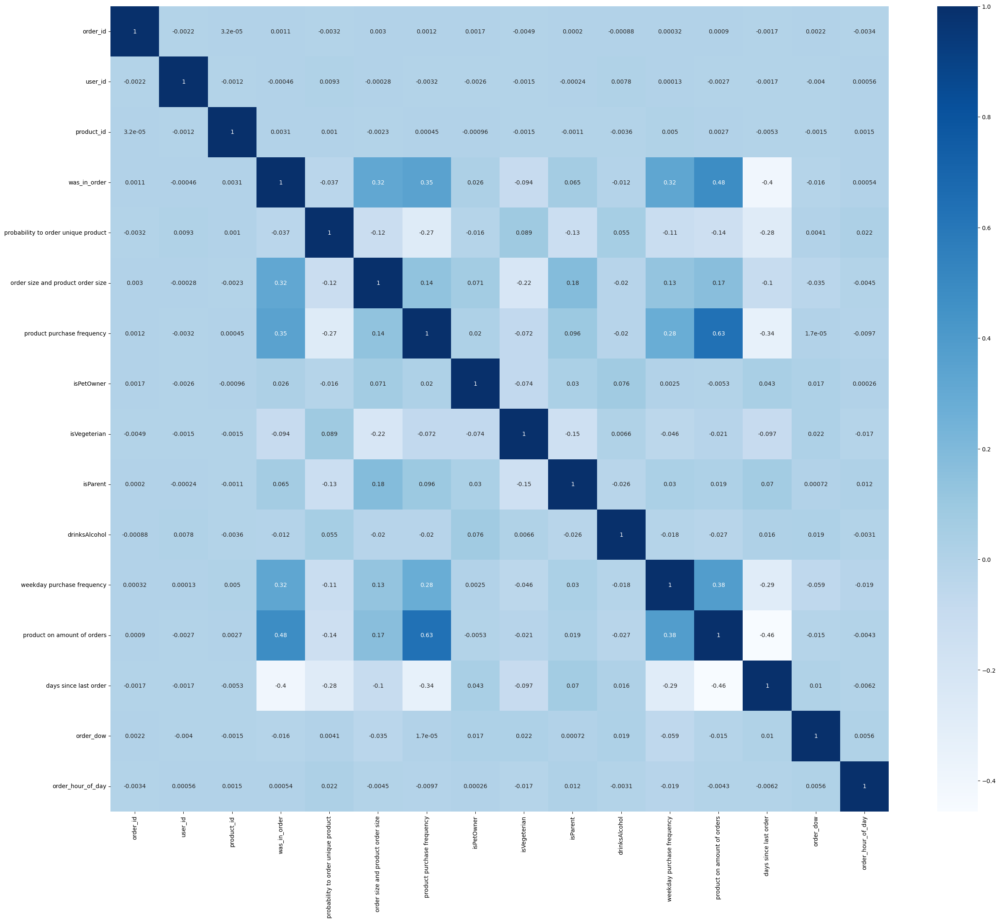

In [214]:
# create correlation heatmap
plt.figure(figsize=(30, 25))
sns.heatmap(featuresDF.corr(), annot=True, cmap='Blues')
plt.show()

It can be seen that there is no correlation between the features

<h3>exclusion</h3>
Since there is no correlation between the features, there are no features that need to be downloaded due to matching between them. At the same time, there are features that need to be downloaded because they are not as meaningful as ID, but first we will split the users and products from the features because they require the deletion of different things. Since we also want to use the classifications as features, the deletion will be requested only before sending to the models (in the prediction part)

In [215]:
ClassificationDF.isna().sum()

order_id                                      0
user_id                                       0
product_id                                    0
probability to order unique product           0
order size and product order size             0
product purchase frequency                    0
isPetOwner                                    0
isVegeterian                                  0
isParent                                      0
drinksAlcohol                                 0
weekday purchase frequency                    0
product on amount of orders                   0
days since last order                  28049797
order_dow                                     0
order_hour_of_day                             0
eval_set                                      0
dtype: int64

In [216]:
ClassificationDF.shape

(32434489, 16)

As you can see, most get null, so we will remove it (any attempt to perform imputation will cause too much distortion)

In [217]:
ClassificationDF.drop('days since last order',axis=1,inplace=True)

<h5>get the users:</h5>

In [218]:
users=ClassificationDF.groupby('user_id').mean()
users.drop(['order_id', 'product_id'],axis=1,inplace=True)
display(users.sample(5))

,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency,product on amount of orders,order_dow,order_hour_of_day
user_id,,,,,,,,,,,
105896,0.075397,-5.209309,12.920635,0.0,1.0,0.0,0.0,0.091270,0.201885,3.190476,1.710317
192419,0.318436,-0.073466,3.603352,0.0,0.0,0.0,0.0,0.022346,0.277181,3.642458,1.765363
174074,0.219048,6.366761,4.095238,0.0,1.0,1.0,0.0,0.000000,0.409524,3.152381,1.828571
100530,0.231707,2.795609,4.195122,0.0,0.0,0.0,0.0,0.000000,0.419512,4.402439,2.140244
117475,0.324022,2.016362,2.564246,0.0,0.0,0.0,0.0,0.000000,0.233113,3.486034,1.312849


<h5>Correlation</h5>
We will check if there is a correlation between the features to see if they are all needed

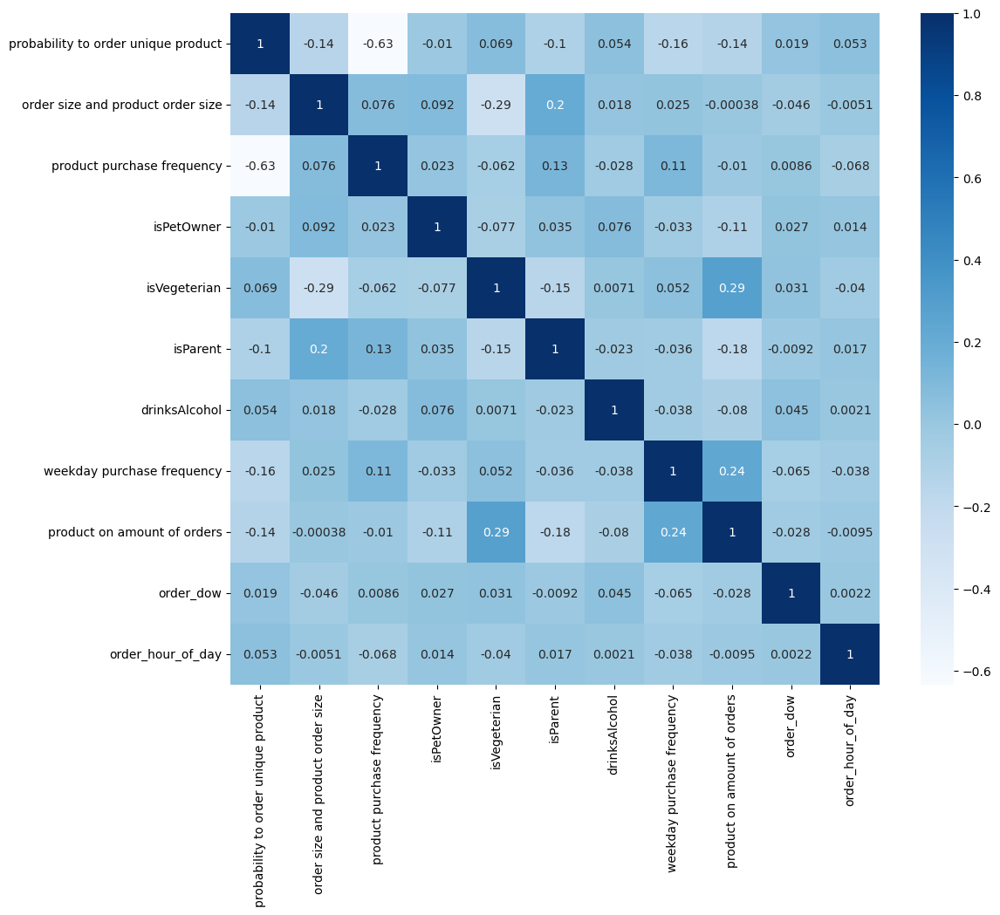

In [219]:
# create correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(users.corr(), annot=True, cmap='Blues')
plt.show()

It can be seen that there is no correlation between the features

In [220]:
#creating a copy array
users_arr=np.array(users)

<h5>get the products:</h5>

In [221]:
products1=ClassificationDF.groupby('product_id').mean()
products1.drop(['order_id', 'user_id'],axis=1,inplace=True)
display(products1.sample(5))

,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,drinksAlcohol,weekday purchase frequency,product on amount of orders,order_dow,order_hour_of_day
product_id,,,,,,,,,,,
2973,0.331942,0.358333,2.244444,0.288889,0.200000,0.266667,0.155556,0.000000,0.097415,2.955556,1.733333
14493,0.265544,-0.005915,8.486486,0.126391,0.192766,0.395072,0.177266,0.044913,0.344711,2.645469,1.655008
2922,0.351188,-0.077092,3.281046,0.218954,0.192810,0.235294,0.287582,0.042484,0.208457,3.062092,1.705882
48759,0.354802,-0.007154,4.470588,0.235294,0.382353,0.176471,0.000000,0.088235,0.293375,2.588235,1.323529
838,0.330462,0.346154,2.090909,0.045455,0.454545,0.454545,0.000000,0.000000,0.141934,2.818182,2.045455


<h5>Correlation</h5>
We will check if there is a correlation between the features to see if they are all needed

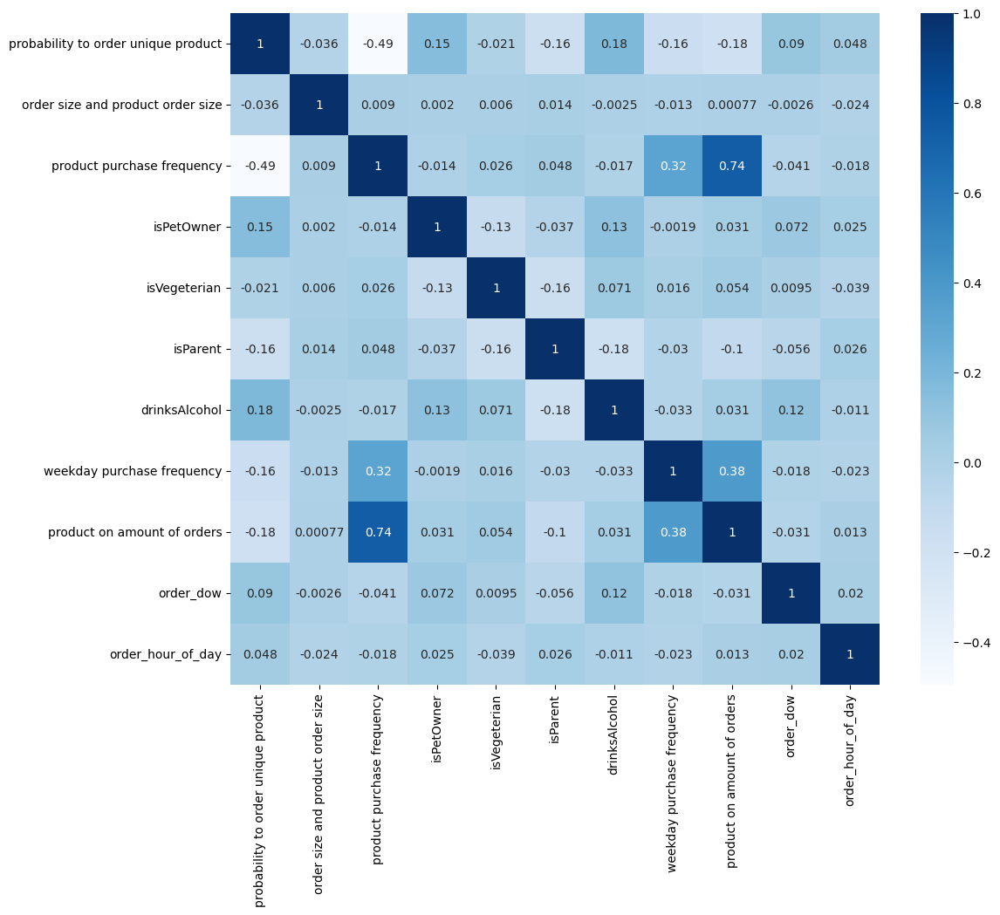

In [222]:
# create correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(products1.corr(), annot=True, cmap='Blues')
plt.show()

There is a correlation between product purchase frequency and product on amount of orders, so we drop product on amount of orders (only from products1)

In [223]:
products1.drop('product on amount of orders',axis=1,inplace=True)
#creating a copy array
products_arr=np.array(products1)

<h3>Transformation</h3>
The PCA requires normalization of the data, so we will create a normalized copy of it

In [224]:
# Standardizing the features
x = StandardScaler().fit_transform(users)

<p id="3"><h1>Customer Classification</h1>
We also decided to use each customer's classification to predict their future orders, so we will do this before predicting the orders.<br>
We chose to perform the prediction using Kmeans and mean shift</p>
For paremeters tuning on Kmeans we've used the elbow method to find the optimal K size<br>In mean shift we've used "estimate_bandwidth" sklearn method to find optimal h

<p id="3.1"><h2>KMeans</h2></p>

In [225]:
#find the optimal K 
distortions = []
K = range(1,11)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(users_arr)
    distortions.append(kmeanModel.inertia_)

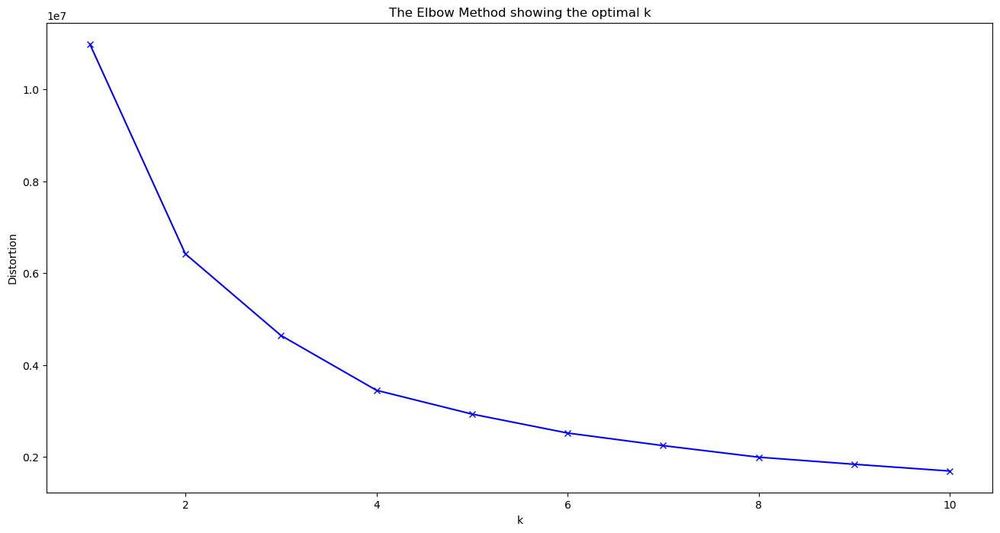

In [226]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

The elbow point is k=4

In [227]:
#Calculating the results according to the k found as the elbow point
kmeanModel = KMeans(n_clusters=4)
labels = kmeanModel.fit_predict(users_arr)
score=metrics.silhouette_score(users, labels, metric='euclidean')
print('score',score)
scores={'kmeans':score}

score 0.3836063596789785


<Figure size 1000x1000 with 0 Axes>

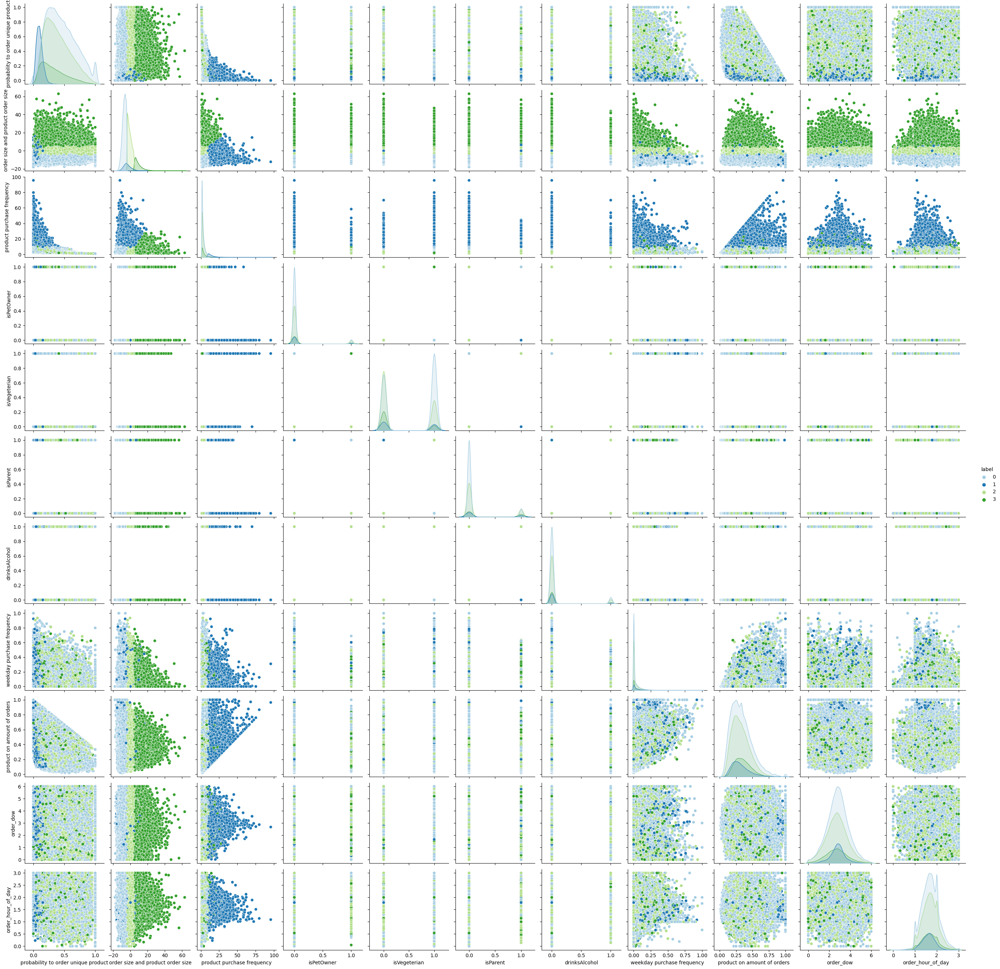

In [228]:
#Getting the Centroids
centroids = kmeanModel.cluster_centers_
u_labels = np.unique(labels)

users1=users.copy()
users1['label']=labels

#plotting the results: 
plt.figure(figsize=(10,10))
sns.pairplot(users1,hue='label',palette='Paired')

The best features that contribute to seperation were "Order size and product order size",  "Product purchase frequency". The otheres were a bit "messy"

In [229]:
#Saving the classifications for use in the prediction
users_class=pd.DataFrame(users.index)
users_class.rename(columns={0:'user_id'},inplace=True)
users_class['kmeans']=labels

<p id="3.2"><h2>Mean Shift</h2></p>

In [230]:
#mean shift
# The following bandwidth can be automatically detected using
bandwidth = estimate_bandwidth(users_arr, quantile=0.3, n_samples=500)

meanShiftModel = MeanShift(bandwidth=bandwidth, bin_seeding=True)
meanShiftModel.fit(users_arr)
labels = meanShiftModel.labels_
#cluster_centers = meanShiftModel.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)
score=metrics.silhouette_score(users_arr, labels, metric='euclidean')
print('score',score)
scores['mean_shift']=score

number of estimated clusters : 14
score 0.6066781836034522


<Figure size 640x480 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

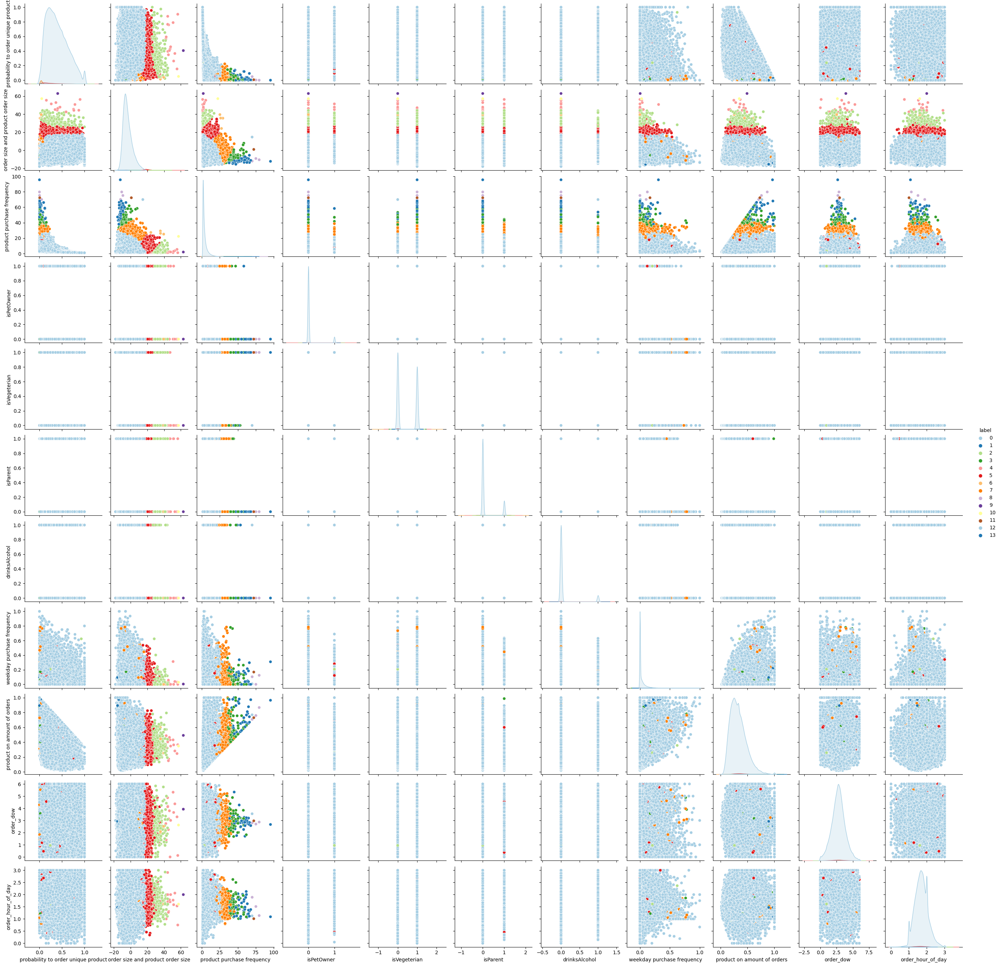

In [231]:
#ploting the results
plt.figure(1)
plt.clf()

users1=users.copy()
users1['label']=labels

#plotting the results: 
plt.figure(figsize=(10,10))
sns.pairplot(users1,hue='label',palette='Paired')


Compared to Kmeans, here most features had some contribution to seperation

In [232]:
#Saving the classifications for use in the prediction
users_class['mean_shift']=labels

<p id="3.3"><h1>Clustering and Dimensions Reduction - Bonus</h1>
Reduce dimensions of the users data using PCA algorithm.</p>

In [233]:
#PCA PROJECTION TO 2D
pca = PCA(n_components=2)

principalComponents = pca.fit_transform(x)

principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [234]:
# We will test how each feature effects each PC

# Principal components correlation coefficients
loadings = pca.components_
 
# Number of features before PCA
n_features = pca.n_features_
 
# Feature names before PCA
feature_names = users.columns
 
# PC names
pc_list = [f'PC{i}' for i in list(range(1, n_features + 1))]
 
# Match PC names to loadings
pc_loadings = dict(zip(pc_list, loadings))
 
# Matrix of corr coefs between feature names and PCs
loadings_df = pd.DataFrame.from_dict(pc_loadings)
loadings_df['feature_names'] = feature_names
loadings_df = loadings_df.set_index('feature_names')
loadings_df

,PC1,PC2
feature_names,,
probability to order unique product,-0.596737,-0.235230
order size and product order size,0.330071,-0.259503
product purchase frequency,0.580345,0.162394
isPetOwner,0.081283,-0.240751
isVegeterian,-0.255947,0.465624
isParent,0.288148,-0.309464
drinksAlcohol,-0.064151,-0.144528
weekday purchase frequency,0.173917,0.374452
product on amount of orders,-0.011039,0.552522


In [235]:
#Preparation for presentation in bioplot.
PC1 = principalDf['principal component 1'].to_numpy()
PC2 = principalDf['principal component 2'].to_numpy()
scalePC1 = 1.0/(PC1.max() - PC1.min())
scalePC2 = 1.0/(PC2.max() - PC2.min())

<Figure size 640x480 with 0 Axes>

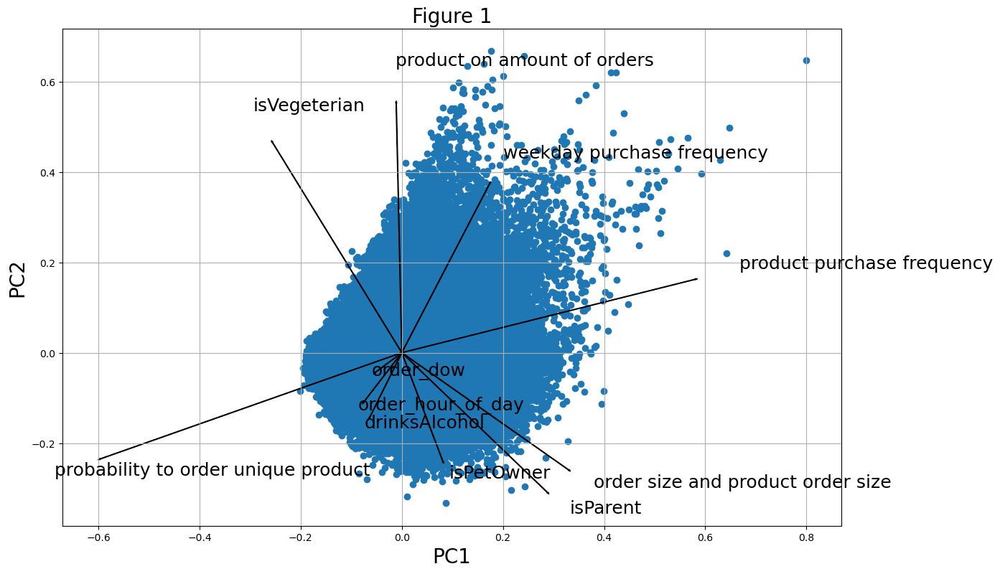

<Figure size 640x480 with 0 Axes>

In [236]:
#Displaying a biplot to understand how each feature affects each component
fig, ax = plt.subplots(figsize=(14, 9))
 
ax.scatter(PC1 * scalePC1,PC2 * scalePC2)

for i, feature in enumerate(users.columns):
    ax.arrow(0, 0, loadings[0, i], 
             loadings[1, i])
    ax.text(loadings[0, i] * 1.15, 
            loadings[1, i] * 1.15, 
            feature, fontsize=18)

ax.set_xlabel('PC1', fontsize=20)
ax.set_ylabel('PC2', fontsize=20)
ax.set_title('Figure 1', fontsize=20)
ax.grid()
plt.figure()

The biggest effect on component 1 is probability to order unique product and product purchase frequency. After that of order size and product order size and of isParent when the rest had little effect.<br>
The biggest impact on component 2 is product on amount of orders and isVegetarian. After that of weekday purchase frequency and of isParent and then of order size and product order size, of isPetOwner and of isParent.

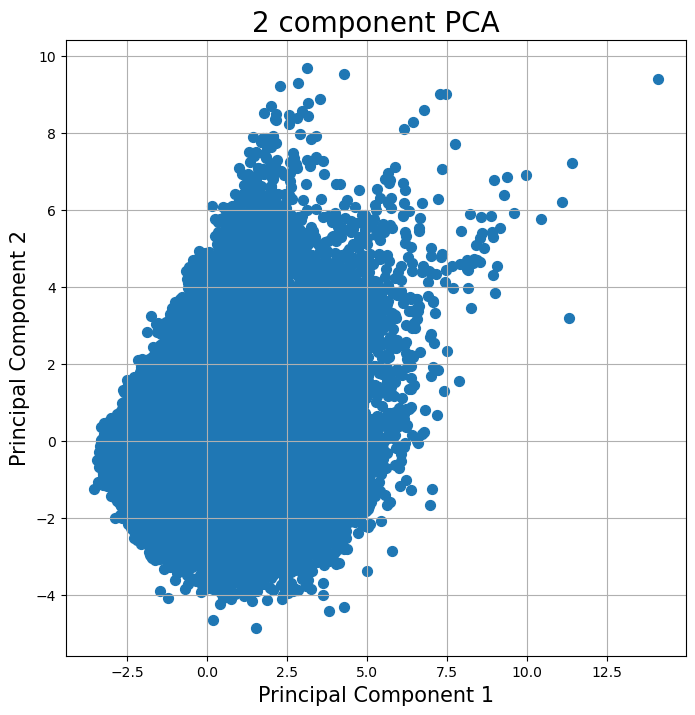

In [237]:
#VISUALIZE 2D PROJECTION
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)

ax.scatter(principalDf.loc[:, 'principal component 1']
           , principalDf.loc[:, 'principal component 2']
           , s = 50)
ax.grid()

[0.16669162 0.14786858]


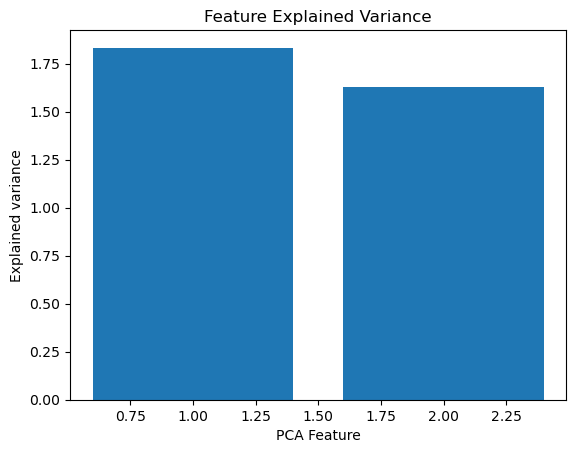

In [238]:
print(pca.explained_variance_ratio_)
# Bar plot of explained_variance
plt.bar(
    range(1,len(pca.explained_variance_)+1),
    pca.explained_variance_
)
plt.xlabel('PCA Feature')
plt.ylabel('Explained variance')
plt.title('Feature Explained Variance')
plt.show()

In [239]:
principal_arr=np.array(principalDf)

<p id="3.3.1"><h3>KMeans on the PCA</h3></p>

In [240]:
#find the optimal K
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(principal_arr)
    distortions.append(kmeanModel.inertia_)

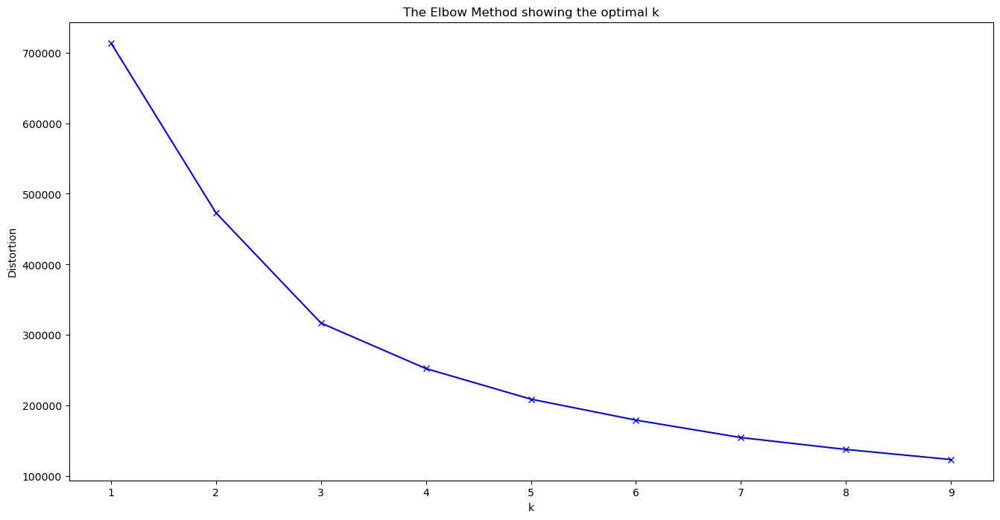

In [241]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

The elbow piont is k=5

In [242]:
#Calculating the results according to the k found as the elbow point
kmeanModel = KMeans(n_clusters=5)
labels = kmeanModel.fit_predict(principal_arr)
score=metrics.silhouette_score(users, labels, metric='euclidean')
print('score',score)
scores['pca_kmeans']=score

score -0.024098378597188316


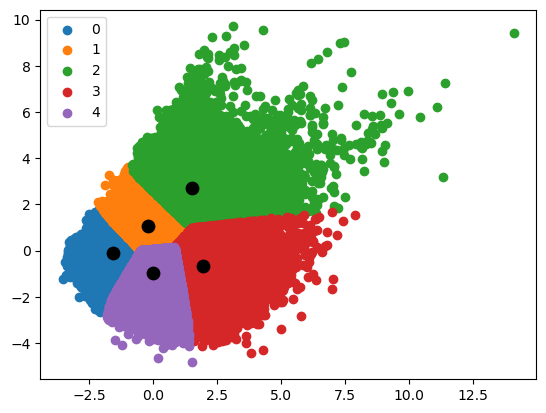

In [243]:
#Getting the Centroids
centroids = kmeanModel.cluster_centers_
u_labels = np.unique(labels)

#plotting the results:
for i in u_labels:
    plt.scatter(principal_arr[labels == i , 0] , principal_arr[labels == i , 1] , label = i)
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend()
plt.show()

Both PCA features had contribution for seperation

In [244]:
#Saving the classifications for use in the prediction
users_class['pca_kmeans']=labels

<p id="3.3.2"><h3>Mean Shift on the PCA</h3></p>

In [245]:
#mean shift
# The following bandwidth can be automatically detected using
bandwidth = estimate_bandwidth(users_arr, quantile=0.005, n_samples=500)

meanShiftModel = MeanShift(bandwidth=bandwidth, bin_seeding=True)
meanShiftModel.fit(principal_arr)
labels = meanShiftModel.labels_
cluster_centers = meanShiftModel.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)
if(n_clusters_>1):
    score=metrics.silhouette_score(users, labels, metric='euclidean')
    print('score',score)
    scores['pca_mean_shift']=score

number of estimated clusters : 5
score 0.3214949270120572


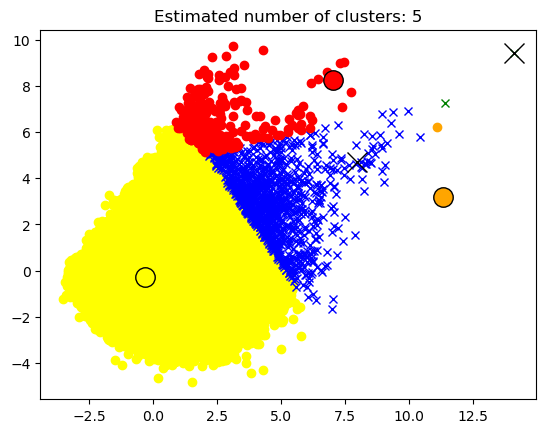

In [246]:
#ploting the results
plt.figure(1)
plt.clf()

colors = ['yellow', 'blue', 'red','green','orange','pink','purple','turquoise','black']
markers = ["o", "x", "o","x","o","x","o","x","o"]

for k, col in zip(range(n_clusters_), colors):
    my_members = labels == k
    cluster_center = cluster_centers[k]
    plt.plot(principal_arr[my_members, 0], principal_arr[my_members, 1], markers[k], color=col)
    plt.plot(
        cluster_center[0],
        cluster_center[1],
        markers[k],
        markerfacecolor=col,
        markeredgecolor="k",
        markersize=14,
    )
plt.title("Estimated number of clusters: %d" % n_clusters_)
plt.show()

Both PCA features had contribution for seperation

In [247]:
#Saving the classifications for use in the prediction
users_class['pca_mean_shift']=labels

In [248]:
#merging clusters into featuresDF
featuresDF = pd.merge(featuresDF, users_class, on='user_id', how='left')
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,...,weekday purchase frequency,product on amount of orders,days since last order,order_dow,order_hour_of_day,eval_set,kmeans,mean_shift,pca_kmeans,pca_mean_shift
0,1187899,1,196,1,0.135593,3.736045,10.0,0,1,0,...,0.300000,1.0,14.0,4,1,test,2,0,2,0
1,1187899,1,26088,1,0.135593,0.684844,2.0,0,1,0,...,0.000000,0.2,175.0,4,1,test,2,0,2,0
2,1187899,1,26405,1,0.135593,6.369219,2.0,0,1,0,...,0.500000,0.2,125.0,4,1,test,2,0,2,0
3,1187899,1,10258,1,0.135593,4.075122,9.0,0,1,0,...,0.333333,0.9,14.0,4,1,test,2,0,2,0
4,1187899,1,13032,1,0.135593,1.471311,3.0,0,1,0,...,0.333333,0.3,14.0,4,1,test,2,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502293,0.0,0,0,0,...,0.000000,0.0,56.0,0,2,train,0,0,0,0
2953140,2839453,170084,38434,0,1.000000,-13.528735,0.0,0,0,0,...,0.000000,0.0,56.0,0,2,train,0,0,0,0
2953141,2839453,170084,10070,0,1.000000,-13.381804,0.0,0,0,0,...,0.000000,0.0,56.0,0,2,train,0,0,0,0
2953142,2839453,170084,43006,0,1.000000,-15.666667,0.0,0,0,0,...,0.000000,0.0,56.0,0,2,train,0,0,0,0


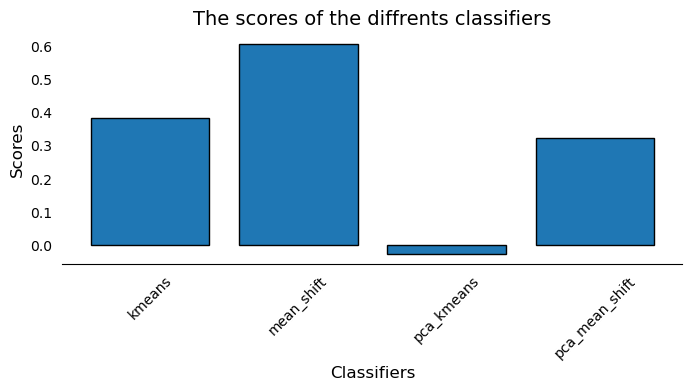

In [249]:
#compering the scores
plt.figure(figsize=(8, 3))
plt.bar(scores.keys(), scores.values(), edgecolor='black')
plt.xticks(rotation=45)
plt.title('The scores of the diffrents classifiers', fontsize=14)
plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('Scores', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

In [250]:
#Compring results to PCA results
kmeans=len(users_class[users_class['kmeans']!=users_class['pca_kmeans']])/len(users_class)
mean_shift=len(users_class[users_class['mean_shift']!=users_class['pca_mean_shift']])/len(users_class)
d=pd.DataFrame()
d[0]={'kmeans':kmeans,'mean_shift':mean_shift}
display(d.T)

,kmeans,mean_shift
0,0.762149,0.017429


The above results show the percentage of users that have recieved a different classification in each algorithm type, after implementing PCA

We see that in Kmeans most users recieved a different classification after implementing PCA, most of it is due to the fact PCA has a lot of loss data, and also both algorithms used different size of clusters.<br>
You can see the classifications before and after in the appropriate section (they cannot be shown in the same graph due to differences in the size of the dimensions and we did not want to simply print the same graphs next to each other again)

<p id="3.4"><h1>Product Classification</h1>
using Mean Shift</p>

In [251]:
#mean shift
# The following bandwidth can be automatically detected using
bandwidth = estimate_bandwidth(products_arr, quantile=0.3, n_samples=500)

meanShiftModel = MeanShift(bandwidth=bandwidth, bin_seeding=True)
meanShiftModel.fit(products_arr)
labels = meanShiftModel.labels_
cluster_centers = meanShiftModel.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)
print('score',metrics.silhouette_score(products_arr, labels, metric='euclidean'))

number of estimated clusters : 20
score 0.5431076638377257


<Figure size 640x480 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

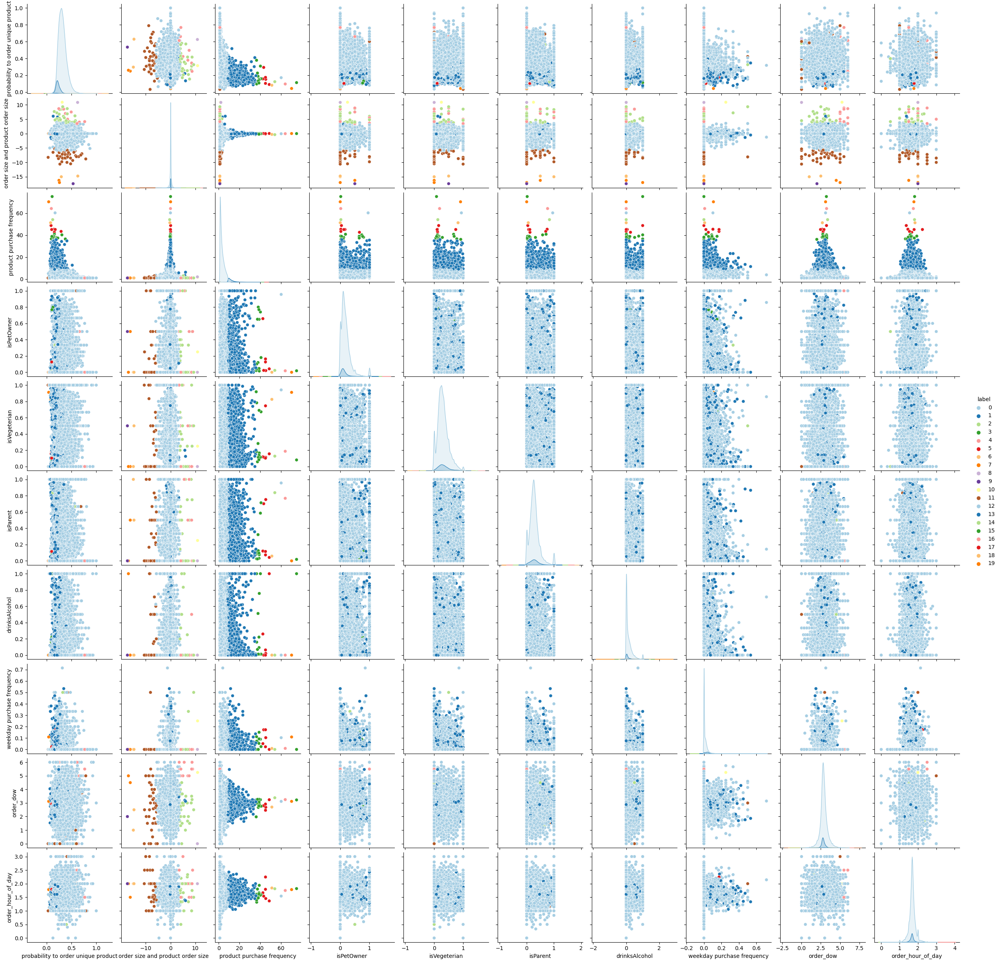

In [252]:
#ploting the results
plt.figure(1)
plt.clf()

products1['label']=labels

#plotting the results: 
plt.figure(figsize=(10,10))
sns.pairplot(products1,hue='label',palette='Paired')


Most features have some contribution to the seperation, this is after we've excluded "Order size and product order size" during pre-processing

In [253]:
#Saving the classifications for use in the prediction
products_class=pd.DataFrame(products1.index)
products_class.rename(columns={0:'product_id'},inplace=True)
products_class['product_class']=labels

In [254]:
#merge product clusters into featuresDF
featuresDF = pd.merge(featuresDF, products_class, on='product_id', how='left')
featuresDF

,order_id,user_id,product_id,was_in_order,probability to order unique product,order size and product order size,product purchase frequency,isPetOwner,isVegeterian,isParent,...,product on amount of orders,days since last order,order_dow,order_hour_of_day,eval_set,kmeans,mean_shift,pca_kmeans,pca_mean_shift,product_class
0,1187899,1,196,1,0.135593,3.736045,10.0,0,1,0,...,1.0,14.0,4,1,test,2,0,2,0,13.0
1,1187899,1,26088,1,0.135593,0.684844,2.0,0,1,0,...,0.2,175.0,4,1,test,2,0,2,0,0.0
2,1187899,1,26405,1,0.135593,6.369219,2.0,0,1,0,...,0.2,125.0,4,1,test,2,0,2,0,0.0
3,1187899,1,10258,1,0.135593,4.075122,9.0,0,1,0,...,0.9,14.0,4,1,test,2,0,2,0,13.0
4,1187899,1,13032,1,0.135593,1.471311,3.0,0,1,0,...,0.3,14.0,4,1,test,2,0,2,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2953139,2839453,170084,45066,0,1.000000,-14.502293,0.0,0,0,0,...,0.0,56.0,0,2,train,0,0,0,0,13.0
2953140,2839453,170084,38434,0,1.000000,-13.528735,0.0,0,0,0,...,0.0,56.0,0,2,train,0,0,0,0,0.0
2953141,2839453,170084,10070,0,1.000000,-13.381804,0.0,0,0,0,...,0.0,56.0,0,2,train,0,0,0,0,13.0
2953142,2839453,170084,43006,0,1.000000,-15.666667,0.0,0,0,0,...,0.0,56.0,0,2,train,0,0,0,0,0.0


In [255]:
#there are products which were not in prior and are part of the train or test data
featuresDF[featuresDF['product_class'].isna()].groupby('product_id')['order_id'].count()

product_id
3718      6
25383     5
27499     7
36233     9
37703     6
43725    10
45971     6
49540     7
Name: order_id, dtype: int64

In [256]:
#we will assing them with a new cluster
newCluster = featuresDF['product_class'].max()+1
featuresDF = featuresDF.fillna(newCluster)
featuresDF.isna().sum()

order_id                               0
user_id                                0
product_id                             0
was_in_order                           0
probability to order unique product    0
order size and product order size      0
product purchase frequency             0
isPetOwner                             0
isVegeterian                           0
isParent                               0
drinksAlcohol                          0
weekday purchase frequency             0
product on amount of orders            0
days since last order                  0
order_dow                              0
order_hour_of_day                      0
eval_set                               0
kmeans                                 0
mean_shift                             0
pca_kmeans                             0
pca_mean_shift                         0
product_class                          0
dtype: int64

<p id="4"><h1>Prediction</h1>
We will use 3 prediction algorithms to predict future orders:<ol>
    <li>Random forest</li>
    <li>Gradient boost</li>
    <li>KNN</li>
</ol></p>

In [257]:
# define function to calculate metrics
def get_metrics(y_test, y_pred):
    
    actual_pos = y_test == 1
    actual_neg = y_test == 0
    
    # get confusion matrix
    mat = metrics.confusion_matrix(y_test, y_pred)
    true_neg, false_pos, false_neg, true_pos = mat.ravel()
    
    # calculate sensitivity and specificity
    sensitivity = round(true_pos / np.sum(actual_pos), 3)
    specificity = round(true_neg / np.sum(actual_neg), 3)
    
    return sensitivity, specificity

In [294]:
# split dataset into training set and test set
train = featuresDF[featuresDF['eval_set']=='train']
test = featuresDF[featuresDF['eval_set']=='test']
X_train = train.drop(['order_id', 'user_id', 'product_id', 'was_in_order', 'eval_set'], axis=1)
X_test = test.drop(['order_id', 'user_id', 'product_id', 'was_in_order', 'eval_set'], axis=1)
y_train = train['was_in_order']
y_test = test['was_in_order']

<p id="4.1"><h2>Random Forest</h2></p>

In [259]:
#changeing dtypes to category where needed

In [260]:
X_trainRF=X_train.copy()
X_trainRF['order_dow']=X_trainRF['order_dow'].astype('category')
X_trainRF['isPetOwner']=X_trainRF['isPetOwner'].astype('category')
X_trainRF['isVegeterian']=X_trainRF['isVegeterian'].astype('category')
X_trainRF['drinksAlcohol']=X_trainRF['drinksAlcohol'].astype('category')
X_trainRF['order_hour_of_day']=X_trainRF['order_hour_of_day'].astype('category')
X_trainRF['kmeans']=X_trainRF['kmeans'].astype('category')
X_trainRF['mean_shift']=X_trainRF['mean_shift'].astype('category')
X_trainRF['pca_kmeans']=X_trainRF['pca_kmeans'].astype('category')
X_trainRF['pca_mean_shift']=X_trainRF['pca_mean_shift'].astype('category')
X_trainRF['product_class']=X_trainRF['product_class'].astype('category')
X_trainRF['isParent']=X_trainRF['isParent'].astype('category')

In [261]:
X_testRF=X_test.copy()
X_testRF['order_dow']=X_testRF['order_dow'].astype('category')
X_testRF['isPetOwner']=X_testRF['isPetOwner'].astype('category')
X_testRF['isVegeterian']=X_testRF['isVegeterian'].astype('category')
X_testRF['drinksAlcohol']=X_testRF['drinksAlcohol'].astype('category')
X_testRF['order_hour_of_day']=X_testRF['order_hour_of_day'].astype('category')
X_testRF['kmeans']=X_testRF['kmeans'].astype('category')
X_testRF['mean_shift']=X_testRF['mean_shift'].astype('category')
X_testRF['pca_kmeans']=X_testRF['pca_kmeans'].astype('category')
X_testRF['pca_mean_shift']=X_testRF['pca_mean_shift'].astype('category')
X_testRF['product_class']=X_testRF['product_class'].astype('category')
X_testRF['isParent']=X_testRF['isParent'].astype('category')

In [262]:
# define model
rf = RandomForestClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'max_depth': [4,5,6],
    'min_samples_split': [2,4],
    'min_samples_leaf': [3,4],
    'n_estimators': [20]
}

# define grid search
grid_search = GridSearchCV(estimator=rf, param_grid=parameters_grid, cv=10)

In [263]:
# fit estimator
grid_search.fit(X_trainRF, y_train)

# get best estimator
best = grid_search.best_estimator_

In [264]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,max_depth,min_samples_leaf,min_samples_split,n_estimators
Selected Value,5,3,2,20


In [265]:
# predict
y_pred = best.predict(X_testRF)

In [266]:
# calculate metrics
acc = round(accuracy_score(y_test, y_pred), 3)
sensitivity, specificity = get_metrics(y_test, y_pred)

# display metrics
rf_df = pd.DataFrame([acc, sensitivity, specificity]).T
rf_df = rf_df.rename(index={0: 'Random Forest Classifier'}, columns={0: 'Accuracy', 1: 'Sensitivity', 2: 'Specificity'})
rf_df

,Accuracy,Sensitivity,Specificity
Random Forest Classifier,0.795,0.597,0.97


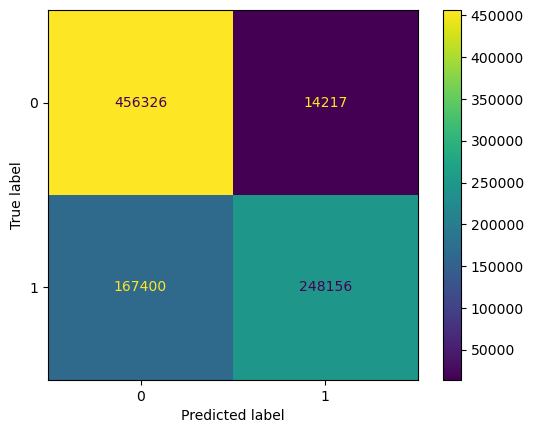

In [267]:
# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create the ConfusionMatrixDisplay object
cmd = ConfusionMatrixDisplay(cm)

# Plot the confusion matrix
cmd.plot()
plt.show()

In [268]:
# get feature importance
imp = pd.DataFrame(grid_search.best_estimator_.fit(X_trainRF, y_train).feature_importances_, 
                   index=X_trainRF.columns, columns=['Importance']).sort_values('Importance')

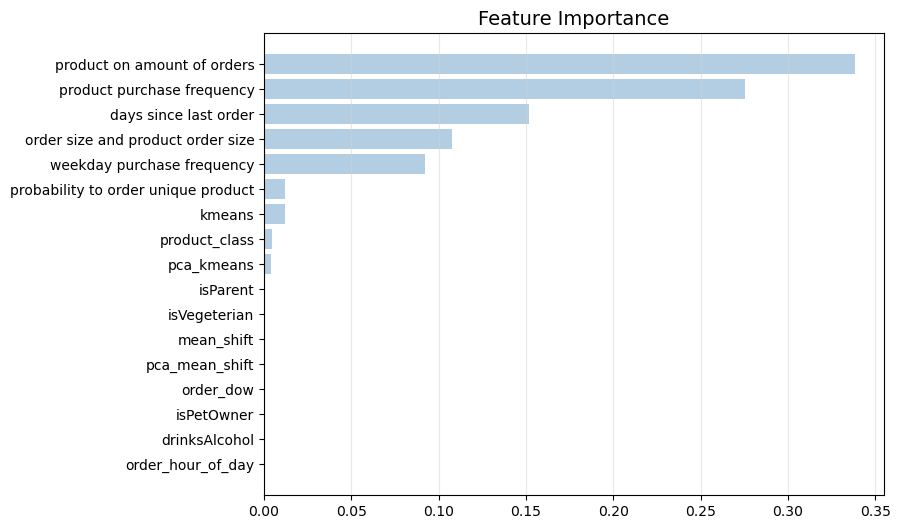

In [269]:
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

In [307]:
#create a DF for all resutls
predictResults = pd.DataFrame(y_test.copy())
#add random forest results
predictResults['Random Forest'] = y_pred.tolist()
predictResults

,was_in_order,Random Forest
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
2953113,0,0
2953114,0,0
2953115,0,0
2953116,0,0


<p id="4.2"><h2>Gradient Boosting</h2></p>

In [310]:
# define model
gb = GradientBoostingClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'learning_rate': [0.5, 1, 1.5],
    'n_estimators': [20]
}

# define grid search
grid_search = GridSearchCV(estimator=gb, param_grid=parameters_grid, cv=10)

In [311]:
# fit estimator
grid_search.fit(X_trainRF, y_train)

# get best estimator
best = grid_search.best_estimator_

In [312]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,learning_rate,n_estimators
Selected Value,1,20


In [313]:
# predict
y_pred = best.predict(X_testRF)

In [314]:
# calculate metrics
acc = round(accuracy_score(y_test, y_pred), 3)
sensitivity, specificity = get_metrics(y_test, y_pred)

# display metrics
gb_df = pd.DataFrame([acc, sensitivity, specificity]).T
gb_df = gb_df.rename(index={0: 'Gradient Boosting Classifier'}, columns={0: 'Accuracy', 1: 'Sensitivity', 2: 'Specificity'})
gb_df

,Accuracy,Sensitivity,Specificity
Gradient Boosting Classifier,0.802,0.664,0.923


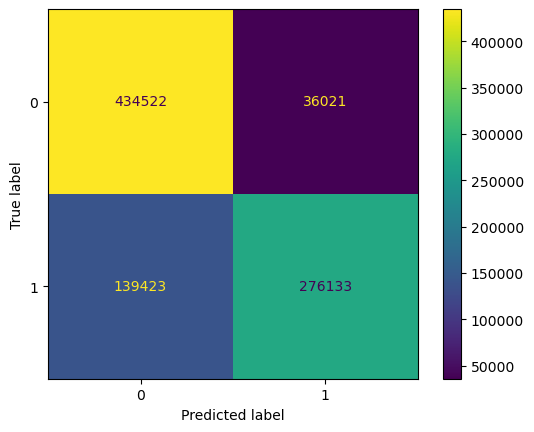

In [315]:
# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create the ConfusionMatrixDisplay object
cmd = ConfusionMatrixDisplay(cm)

# Plot the confusion matrix
cmd.plot()
plt.show()

In [316]:
# get feature importance
imp = pd.DataFrame(grid_search.best_estimator_.fit(X_trainRF, y_train).feature_importances_, 
                   index=X_trainRF.columns, columns=['Importance']).sort_values('Importance')

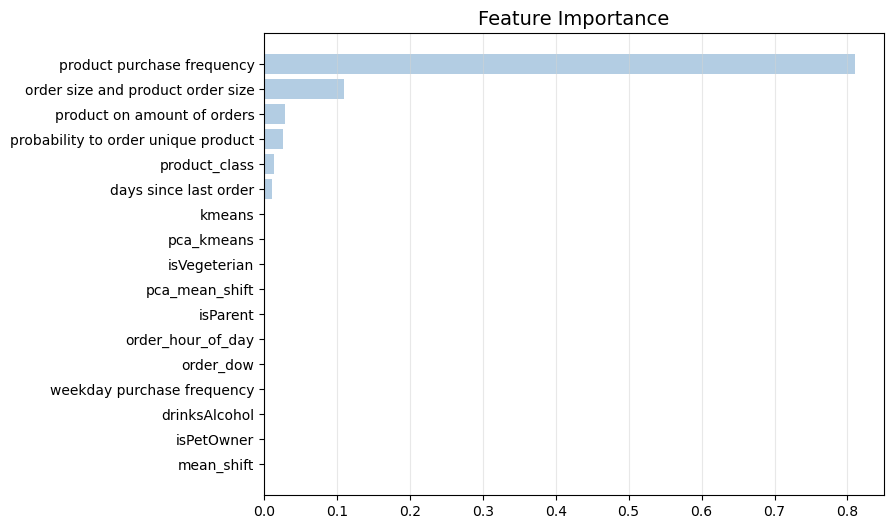

In [317]:
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

In [320]:
#add results to DF
predictResults['Gradient Boost'] = y_pred.tolist()
predictResults

,was_in_order,Random Forest,Gradient Boost
0,1,1,1
1,1,1,1
2,1,1,1
3,1,1,1
4,1,1,1
...,...,...,...
2953113,0,0,0
2953114,0,0,0
2953115,0,0,0
2953116,0,0,0


<p id="4.3"><h2>KNN</h2></p>

In [323]:
#after we've reviewed results from RF and GB, we've decided to use just the top five features that were used + we will not categorial features
#Product on amount of orders, Product purchase frequency, Days since last order, Order size and product order size, Weekday purchase frequency, Probability to order unique product

#feature tuning on KNN train
knn_X_train = X_train.copy()
knn_X_train = knn_X_train.drop(columns={'isPetOwner', 'isParent', 'drinksAlcohol', 'order_dow', 'order_hour_of_day', 'isVegeterian', 'product_class', 'pca_mean_shift',
                                       'pca_kmeans', 'mean_shift', 'kmeans'}, axis=1)

#feature tuning on KNN test
knn_X_test = X_test.copy()
knn_X_test = knn_X_test.drop(columns={'isPetOwner', 'isParent', 'drinksAlcohol', 'order_dow', 'order_hour_of_day', 'isVegeterian', 'product_class', 'pca_mean_shift',
                                       'pca_kmeans', 'mean_shift', 'kmeans'}, axis=1)

In [324]:
# define model
knn = KNeighborsClassifier()

# define parameter grid
parameters_grid = {
    'n_neighbors': [3, 5],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

# define grid search
grid_search = GridSearchCV(estimator=knn, param_grid=parameters_grid, cv=10)

In [325]:
# fit estimator
grid_search.fit(knn_X_train, y_train)

# get best estimator
best = grid_search.best_estimator_

In [326]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,n_neighbors,p,weights
Selected Value,5,2,uniform


In [327]:
# predict
y_pred = best.predict(knn_X_test)

In [328]:
# calculate metrics
acc = round(accuracy_score(y_test, y_pred), 3)
sensitivity, specificity = get_metrics(y_test, y_pred)

# display metrics
tuned_knn_df = pd.DataFrame([acc, sensitivity, specificity]).T
tuned_knn_df = tuned_knn_df.rename(index={0: 'KNN Classifier'}, columns={0: 'Accuracy', 1: 'Sensitivity', 2: 'Specificity'})
tuned_knn_df

,Accuracy,Sensitivity,Specificity
KNN Classifier,0.77,0.693,0.838


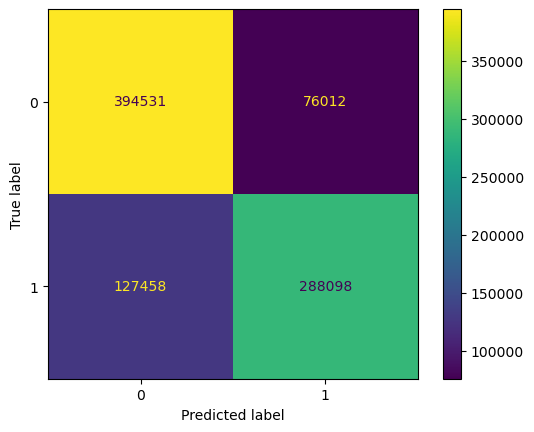

In [329]:
# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create the ConfusionMatrixDisplay object
cmd = ConfusionMatrixDisplay(cm)

# Plot the confusion matrix
cmd.plot()
plt.show()

In [337]:
#add results to DF
predictResults['KNN'] = y_pred.tolist()
predictResults

,was_in_order,Random Forest,Gradient Boost,KNN
0,1,1,1,1
1,1,1,1,1
2,1,1,1,1
3,1,1,1,1
4,1,1,1,1
...,...,...,...,...
2953113,0,0,0,0
2953114,0,0,0,0
2953115,0,0,0,0
2953116,0,0,0,0


In [340]:
#add order_id and product_id to the prediction results
predictResults = pd.merge(target[['order_id', 'product_id']], predictResults, left_index=True, right_index=True)
predictResults

,order_id,product_id,was_in_order,Random Forest,Gradient Boost,KNN
0,1187899,196,1,1,1,1
1,2757217,196,1,1,1,1
2,632715,196,1,1,1,1
3,1167274,196,1,1,1,1
4,3347074,196,1,1,1,1
...,...,...,...,...,...,...
2953113,3408800,15860,0,0,0,0
2953114,3408800,5785,0,0,0,0
2953115,3408800,32578,0,0,0,0
2953116,3408800,117,0,0,0,0


In [336]:
#summary of all predicting models
pd.concat([rf_df, gb_df, tuned_knn_df])

,Accuracy,Sensitivity,Specificity
Random Forest Classifier,0.795,0.597,0.970
Gradient Boosting Classifier,0.802,0.664,0.923
KNN Classifier,0.770,0.693,0.838


The field we care about the most is the sesitivity rate, since we don't want a customer to enter our store and not find the product he needs. On those cases he will go to one of our competitors to purchase the product.
Therefore, the best model is KNN